# Preview - Ames Housing

- Goal of this notebook is to paste a template version of the workflow from the ADMIN_Comparing_Datasets notebook.
 
**The code will:**
- Create 4 preprocessing pipelines (one with scaling and one without)
    - `preprocessor`
        - Clone: `preprocessor_cln`
    - `preprocessor_scale`
        - Clone: `preprocessor_scale_cln`    
    
- Create 4 Versions of the X/y data.
    - **All Data/Rows:**
        - Starting Vars:
            - df,X,y, X_train, X_test,y_train,y_test
        - **Unscaled**
            - Without a  constant:
                - X_train_df, X_test_df, y_train,y_test
            - With a constant:
                - X_train_df_cnst, X_test_df_cnst, y_train (same), y_test (same)
        - **Scaled:**
            - Without a  constant:
                - X_train_df_scaled, X_test_df_scaled, y_train (same), y_test (same)
            - With a constant:
                - X_train_df_scaled_cnst, X_test_df_scaled_cnst, y_train (same), y_test (same)

    - **Cleaned/Outliers Removed**
        - Starting Vars:
            - df_clean,X_cln,y_cln, X_train_cln, X_test_cln,y_train_cln,y_test_cln
        - **Unscaled**
            - Without a  constant:
                - X_train_df_cln, X_test_df_cln, y_train,y_test
            - With a constant:
                - X_train_df_cln_cnst, X_test_df_cln_cnst, y_train_cln (same), y_test_cln (same)
        - **Scaled:**
            - Without a  constant:
                - X_train_df_cln_scaled, X_test_df_cln_scaled, y_train_cln (same), y_test_cln (same)
            - With a constant:
                - X_train_df_scaled_cln_cnst, X_test_df_cln_scaled_cnst, y_train_cln (same), y_test_cln (same)

# Code

In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
## Customization Options
# pd.set_option('display.float_format',lambda x: f"{x:,.4f}")
pd.set_option("display.max_columns",100)
plt.style.use(['fivethirtyeight','seaborn-talk'])
mpl.rcParams['figure.facecolor']='white'

## additional required imports
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.compose import make_column_transformer, make_column_selector, ColumnTransformer
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn import metrics

from sklearn.base import clone

## fixing random for lesson generation
np.random.seed(321)

##import statsmodels correctly
import statsmodels.api as sm
from scipy import stats

## Customized Options
# pd.set_option('display.float_format',lambda x: f"{x:,.4f}")
# plt.style.use('seaborn-talk')

In [2]:
## Adding folder above to path
import os, sys
sys.path.append(os.path.abspath('../'))

## Load stack_functions with autoreload turned on
%load_ext autoreload
%autoreload 2
import stack_functions as sf

def show_code(function):
    import inspect 
    from IPython.display import display,Markdown, display_markdown
    code = inspect.getsource(function)
    md_txt = f"```python\n{code}\n```"
    return display(Markdown(md_txt))
    

## Preliminary Checks and Dtype Conversion

- Change:
    - `FILE`: url or filepath to load
    - `DROP_COLS`: list of columns to drop from df
    - `CONVERT_TO_STR_COLS`: numeric cols to convert to str
    - `CONVERT_TO_NUM_COLS`: str cols to convert to numeric (uses pd.to_numeric)

In [3]:
## Load in data
FILE = "https://docs.google.com/spreadsheets/d/e/2PACX-1vSECHeeoC-lvBG1TA-1DXC5m2VKZ5QqwKRBSTOBW_ivkl40nvNDBYpNzq4X6jmWSzatT4Sr2K-K4Ou2/pub?output=csv"
df = pd.read_csv(FILE)

In [4]:
# from pandas_profiling import ProfileReport
# ProfileReport(df)

In [5]:
df.info()
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [6]:
df.select_dtypes('object').nunique()

MSZoning          5
Street            2
Alley             2
LotShape          4
LandContour       4
Utilities         2
LotConfig         5
LandSlope         3
Neighborhood     25
Condition1        9
Condition2        8
BldgType          5
HouseStyle        8
RoofStyle         6
RoofMatl          8
Exterior1st      15
Exterior2nd      16
MasVnrType        4
ExterQual         4
ExterCond         5
Foundation        6
BsmtQual          4
BsmtCond          4
BsmtExposure      4
BsmtFinType1      6
BsmtFinType2      6
Heating           6
HeatingQC         5
CentralAir        2
Electrical        5
KitchenQual       4
Functional        7
FireplaceQu       5
GarageType        6
GarageFinish      3
GarageQual        5
GarageCond        5
PavedDrive        3
PoolQC            3
Fence             4
MiscFeature       4
SaleType          9
SaleCondition     6
dtype: int64

In [7]:
## Drop unwanted columns
DROP_COLS = ['Id']#,'date']
df = df.drop(columns=DROP_COLS)

In [8]:
## Convert all categories to strings
CONVERT_TO_STR_COLS = []#'zipcode']
df[CONVERT_TO_STR_COLS] = df[CONVERT_TO_STR_COLS].astype(str)

CONVERT_TO_NUM_COLS = []
for col in CONVERT_TO_NUM_COLS:
    df[col] = pd.to_numeric(df[col])

In [9]:
## final info before X/y
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1201 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   Alley          91 non-null     object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuil

## Full Dataset Preprocessing

In [10]:
## Make x and y variables
target = 'SalePrice'#'price'
drop_cols_model = []

y = df[target].copy()
X = df.drop(columns=[target,*drop_cols_model]).copy()

X_train, X_test, y_train, y_test = train_test_split(X,y, random_state=321)
X_train.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
956,160,RM,24.0,1300,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Blueste,Norm,Norm,TwnhsE,2Story,6,6,1980,1980,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,285,Unf,0,276,561,GasA,TA,Y,SBrkr,561,668,0,1229,0,0,1,1,2,1,TA,5,Typ,1,TA,Attchd,1980.0,Fin,2,462,TA,TA,Y,150,0,0,0,0,0,NaN,GdPrv,NaN,0,5,2009,WD,Normal
1076,50,RL,60.0,10800,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,1Fam,1.5Fin,5,8,1936,1989,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,TA,TA,CBlock,Fa,TA,No,ALQ,626,Unf,0,170,796,GasA,Gd,Y,SBrkr,1096,370,0,1466,0,1,2,0,3,1,Gd,7,Min1,1,TA,Attchd,1950.0,Unf,2,566,TA,TA,Y,436,21,0,0,0,0,NaN,NaN,Shed,500,4,2006,WD,Normal
687,160,FV,NaN,5105,Pave,NaN,IR2,Lvl,AllPub,FR2,Gtl,Somerst,Norm,Norm,TwnhsE,2Story,7,5,2004,2004,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,No,GLQ,239,Unf,0,312,551,GasA,Ex,Y,SBrkr,551,551,0,1102,0,0,2,1,2,1,Gd,4,Typ,0,NaN,Detchd,2004.0,Unf,2,480,TA,TA,Y,0,60,0,0,0,0,NaN,NaN,NaN,0,3,2007,WD,Normal
1291,160,RM,21.0,1680,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,BrDale,Norm,Norm,Twnhs,2Story,5,7,1972,1972,Gable,CompShg,CemntBd,CmentBd,BrkFace,268.0,TA,TA,CBlock,TA,TA,No,ALQ,231,Unf,0,399,630,GasA,TA,Y,SBrkr,630,672,0,1302,0,0,2,1,3,1,TA,6,Typ,0,NaN,Detchd,1972.0,Unf,1,264,TA,TA,Y,185,0,0,0,0,0,NaN,NaN,NaN,0,2,2009,WD,Normal
186,80,RL,NaN,9947,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Mitchel,Norm,Norm,1Fam,SLvl,7,5,1990,1991,Gable,CompShg,HdBoard,HdBoard,None,0.0,TA,TA,PConc,Gd,TA,Av,GLQ,611,Unf,0,577,1188,GasA,Ex,Y,SBrkr,1217,0,0,1217,1,0,2,0,3,1,Gd,6,Typ,0,NaN,Attchd,1990.0,Unf,2,497,TA,TA,Y,168,27,0,0,0,0,NaN,GdPrv,NaN,0,6,2009,WD,Normal


### Unscaled

In [11]:
## cat selector
cat_sel = make_column_selector(dtype_include='object')
cat_cols = cat_sel(X)

# num selectorr
num_sel = make_column_selector(dtype_include='number')
num_cols = num_sel(X)

## make pipelines & column transformer - raw numeric
cat_pipe = make_pipeline(SimpleImputer(strategy='constant',
                                       fill_value='MISSING'),
                         OneHotEncoder(handle_unknown='ignore', sparse=False))

num_pipe_raw = make_pipeline(SimpleImputer(strategy='mean'))
preprocessor = make_column_transformer((num_pipe_raw, num_sel),
                                       (cat_pipe,cat_sel), verbose_feature_names_out=False)
preprocessor

ColumnTransformer(transformers=[('pipeline-1',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer())]),
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x150231f40>),
                                ('pipeline-2',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer(fill_value='MISSING',
                                                                strategy='constant')),
                                                 ('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False))]),
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x150231f10>)],
                  verbose_feature_names_out=False)

In [12]:
### PREP ALL X VARS
## Prepare X_train_df
X_train_df = pd.DataFrame( preprocessor.fit_transform(X_train), 
                          columns=preprocessor.get_feature_names_out(),
                         index=X_train.index)

## Prepare X_test_df
X_test_df = pd.DataFrame( preprocessor.transform(X_test),
                         columns=preprocessor.get_feature_names_out(), 
                         index=X_test.index)


## Prepare X vars with constant
X_train_df_cnst = sm.add_constant(X_train_df, prepend=False, has_constant='add')
X_test_df_cnst = sm.add_constant(X_test_df, prepend=False, has_constant='add')

In [13]:
X_train_df.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_MISSING,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,...,GarageType_Detchd,GarageType_MISSING,GarageFinish_Fin,GarageFinish_MISSING,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Ex,GarageQual_Fa,GarageQual_Gd,GarageQual_MISSING,GarageQual_Po,GarageQual_TA,GarageCond_Ex,GarageCond_Fa,GarageCond_Gd,GarageCond_MISSING,GarageCond_Po,GarageCond_TA,PavedDrive_N,PavedDrive_P,PavedDrive_Y,PoolQC_Ex,PoolQC_Fa,PoolQC_Gd,PoolQC_MISSING,Fence_GdPrv,Fence_GdWo,Fence_MISSING,Fence_MnPrv,Fence_MnWw,MiscFeature_Gar2,MiscFeature_MISSING,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,SaleType_COD,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
count,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,...,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000
mean,56.561644,69.577778,10574.686758,6.084932,5.601826,1970.618265,1984.249315,103.660846,438.881279,48.936073,563.311416,1051.128767,1154.779909,347.403653,4.744292,1506.927854,0.417352,0.061187,1.546119,0.389954,2.861187,1.045662,6.513242,0.610959,1977.838959,1.760731,470.138813,93.523288,45.392694,23.387215,3.643836,15.273059,3.210959,53.236530,6.252968,2007.810046,0.009132,0.044749,0.012785,0.777169,0.156164,0.004566,0.995434,0.031963,0.941553,0.026484,0.322374,0.022831,0.006393,0.648402,...,0.279452,0.052968,0.244749,0.052968,0.273973,0.428311,0.001826,0.033790,0.010046,0.052968,0.002740,0.898630,0.001826,0.025571,0.005479,0.052968,0.006393,0.907763,0.063014,0.022831,0.914155,0.000913,0.001826,0.002740,0.994521,0.035616,0.037443,0.806393,0.111416,0.009132,0.001826,0.958904,0.000913,0.037443,0.000913,0.033790,0.003653,0.000913,0.007306,0.003653,0.002740,0.083105,0.001826,0.863014,0.067580,0.003653,0.010046,0.015525,0.817352,0.085845
std,42.066475,20.513329,11026.251101,1.392426,1.112664,30.295836,20.841417,182.215649,457.583581,165.508097,437.368476,448.531105,392.745248,434.481438,43.478550,525.612611,0.520398,0.247290,0.555364,0.506349,0.818491,0.217424,1.629133,0.651442,24.287998,0.737672,210.996411,126.438217,66.047620,62.201638,31.463236,56.779661,43.737837,569.581091,2.695200,1.328388,0.095170,0.206846,0.112399,0.416336,0.363177,0.067450,0.067450,0.175983,0.234695,0.160643,0.467599,0.149433,0.079735,0.477687,...

> The cell below should be updated for each dataset- only separating high cardinality OHE features (e.g. zipcode)

In [14]:
## Save list of zipcode columns and other columns
ohe_cols = [c for c in X_train_df.columns if c.startswith('Neigh')]
nonohe_cols = X_train_df.drop(columns=[*ohe_cols]).columns.tolist()
ohe_cols

['Neighborhood_Blmngtn',
 'Neighborhood_Blueste',
 'Neighborhood_BrDale',
 'Neighborhood_BrkSide',
 'Neighborhood_ClearCr',
 'Neighborhood_CollgCr',
 'Neighborhood_Crawfor',
 'Neighborhood_Edwards',
 'Neighborhood_Gilbert',
 'Neighborhood_IDOTRR',
 'Neighborhood_MeadowV',
 'Neighborhood_Mitchel',
 'Neighborhood_NAmes',
 'Neighborhood_NPkVill',
 'Neighborhood_NWAmes',
 'Neighborhood_NoRidge',
 'Neighborhood_NridgHt',
 'Neighborhood_OldTown',
 'Neighborhood_SWISU',
 'Neighborhood_Sawyer',
 'Neighborhood_SawyerW',
 'Neighborhood_Somerst',
 'Neighborhood_StoneBr',
 'Neighborhood_Timber',
 'Neighborhood_Veenker']

### Scaled

In [15]:
## make pipelines & column transformer - scaled
cat_pipe = make_pipeline(SimpleImputer(strategy='constant',
                                       fill_value='MISSING'),
                         OneHotEncoder(handle_unknown='ignore', sparse=False))
num_pipe_scale = make_pipeline(SimpleImputer(strategy='mean'), StandardScaler())
preprocessor_scale = make_column_transformer((num_pipe_scale, num_sel),
                                       (cat_pipe,cat_sel), verbose_feature_names_out=False)
preprocessor_scale

ColumnTransformer(transformers=[('pipeline-1',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer()),
                                                 ('standardscaler',
                                                  StandardScaler())]),
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x150231f40>),
                                ('pipeline-2',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer(fill_value='MISSING',
                                                                strategy='constant')),
                                                 ('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False))]),
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x150231f10>)],
                  verbose_feature_names_out=False)

In [16]:
# ### PREP ALL SCALED X VARS


# Prepare X_train_scaled_df & X_test_scaled_df
X_train_scaled_df = pd.DataFrame( preprocessor_scale.fit_transform(X_train), 
                          columns=preprocessor_scale.get_feature_names_out(),
                         index=X_train.index)


X_test_scaled_df = pd.DataFrame( preprocessor_scale.transform(X_test),
                         columns=preprocessor_scale.get_feature_names_out(), 
                         index=X_test.index)


## Save vers with constant
X_train_scaled_df_cnst = sm.add_constant(X_train_scaled_df, prepend=False, has_constant='add')
X_test_scaled_df_cnst = sm.add_constant(X_test_scaled_df, prepend=False, has_constant='add')


## Save list of zipcode columns and other columns
ohe_cols = [c for c in X_train_df.columns if c.startswith('zipcode')]
nonohe_cols = X_train_df.drop(columns=[*ohe_cols]).columns.tolist()


X_test_scaled_df.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_MISSING,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,...,GarageType_Detchd,GarageType_MISSING,GarageFinish_Fin,GarageFinish_MISSING,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Ex,GarageQual_Fa,GarageQual_Gd,GarageQual_MISSING,GarageQual_Po,GarageQual_TA,GarageCond_Ex,GarageCond_Fa,GarageCond_Gd,GarageCond_MISSING,GarageCond_Po,GarageCond_TA,PavedDrive_N,PavedDrive_P,PavedDrive_Y,PoolQC_Ex,PoolQC_Fa,PoolQC_Gd,PoolQC_MISSING,Fence_GdPrv,Fence_GdWo,Fence_MISSING,Fence_MnPrv,Fence_MnWw,MiscFeature_Gar2,MiscFeature_MISSING,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,SaleType_COD,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
1070,-0.869537,0.118134,-0.038352,-0.779523,-0.541135,-0.482738,-1.356061,0.089710,0.321659,-0.295807,-0.231744,-0.006979,-0.272005,-0.799948,-0.109168,-0.873528,1.120133,-0.247544,-0.983803,-0.770482,0.169674,-0.21011,-0.315184,-0.938284,-0.899578,-1.031729,-0.873109,-0.740014,-0.384636,-0.376162,-0.115865,3.113927,-0.073447,-0.093509,-0.093902,-0.610074,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
595,-0.869537,-0.028179,0.065992,1.375975,-0.541135,1.135385,1.044105,0.737591,2.149483,-0.295807,-0.391866,1.701598,1.709828,-0.799948,-0.109168,0.607325,1.120133,-0.247544,0.817642,-0.770482,0.169674,-0.21011,0.298920,0.597473,1.118802,1.680741,1.364918,0.684257,0.448477,-0.376162,-0.115865,1.845287,-0.073447,-0.093509,0.648497,-1.363210,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
729,-0.631709,-0.857287,-0.393304,-1.498022,-0.541135,-1.506448,-1.644080,-0.569151,-0.627235,-0.295807,0.147972,-0.604758,-0.781474,-0.799948,8.174561,-0.568983,-0.802352,-0.247544,-0.983803,-0.770482,-1.052645,-0.21011,-0.929288,-0.938284,-0.652429,0.324506,0.326511,-0.740014,-0.339194,1.425256,-0.115865,-0.269111,-0.073447,-0.093509,-1.949899,0.896197,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1040,-0.869537,0.898471,0.231400,-0.779523,-1.440289,-0.449715,0.756085,-0.201287,-0.592253,3.826720,-0.638910,0.184846,1.651239,-0.799948,-0.109168,0.563547,1.120133,-0.247544,0.817642,-0.770482,0.169674,-0.21011,0.913024,0.597473,-0.858386,0.324506,0.065724,-0.740014,-0.687586,-0.376162,-0.115865,-0.269111,-0.073447,-0.093509,-1.949899,-1.363210,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1274,-0.156054,-0.808516,-0.472968,-0.779523,0.358019,-2.001792,0.900095,-0.569151,-0.959566,-0.295807,0.223457,-0.870189,-1.257827,0.556311,-0.109168,-0.489039,-0.802352,-0.247544,0.817642,-0.770482,0.169674,

In [17]:
X_train_scaled_df.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_MISSING,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,...,GarageType_Detchd,GarageType_MISSING,GarageFinish_Fin,GarageFinish_MISSING,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Ex,GarageQual_Fa,GarageQual_Gd,GarageQual_MISSING,GarageQual_Po,GarageQual_TA,GarageCond_Ex,GarageCond_Fa,GarageCond_Gd,GarageCond_MISSING,GarageCond_Po,GarageCond_TA,PavedDrive_N,PavedDrive_P,PavedDrive_Y,PoolQC_Ex,PoolQC_Fa,PoolQC_Gd,PoolQC_MISSING,Fence_GdPrv,Fence_GdWo,Fence_MISSING,Fence_MnPrv,Fence_MnWw,MiscFeature_Gar2,MiscFeature_MISSING,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,SaleType_COD,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
count,1.095000e+03,1.095000e+03,1.095000e+03,1.095000e+03,1.095000e+03,1.095000e+03,1.095000e+03,1.095000e+03,1.095000e+03,1.095000e+03,1.095000e+03,1.095000e+03,1.095000e+03,1.095000e+03,1095.000000,1.095000e+03,1.095000e+03,1.095000e+03,1.095000e+03,1.095000e+03,1.095000e+03,1.095000e+03,1.095000e+03,1.095000e+03,1.095000e+03,1.095000e+03,1.095000e+03,1.095000e+03,1.095000e+03,1.095000e+03,1.095000e+03,1.095000e+03,1.095000e+03,1095.000000,1.095000e+03,1.095000e+03,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,...,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000,1095.000000
mean,2.433366e-17,4.818064e-16,9.246789e-17,-2.952484e-16,2.855149e-16,-3.213665e-15,-4.672062e-16,-6.164526e-17,-4.055609e-17,5.353404e-17,-2.514478e-17,1.200460e-16,-4.704507e-17,2.271141e-17,0.000000,1.703356e-16,6.732311e-17,-1.135571e-17,1.638466e-16,-6.488975e-18,2.498255e-16,-5.081678e-16,-2.108917e-17,-7.137872e-17,-1.881803e-16,8.760116e-17,-1.200460e-16,-4.704507e-17,3.406712e-17,1.297795e-17,6.488975e-18,3.244487e-18,-1.703356e-17,0.000000,-1.176127e-16,-2.689193e-14,0.009132,0.044749,0.012785,0.777169,0.156164,0.004566,0.995434,0.031963,0.941553,0.026484,0.322374,0.022831,0.006393,0.648402,...,0.279452,0.052968,0.244749,0.052968,0.273973,0.428311,0.001826,0.033790,0.010046,0.052968,0.002740,0.898630,0.001826,0.025571,0.005479,0.052968,0.006393,0.907763,0.063014,0.022831,0.914155,0.000913,0.001826,0.002740,0.994521,0.035616,0.037443,0.806393,0.111416,0.009132,0.001826,0.958904,0.000913,0.037443,0.000913,0.033790,0.003653,0.000913,0.007306,0.003653,0.002740,0.083105,0.001826,0.863014,0.067580,0.003653,0.010046,0.015525,0.817352,0.085845
std,1.000457e+00,1.000457e+00,1.000457e+00,1.000457e+00,1.000457e+00,1.000457e+00,1.000457e+00,1.000457e+00,1.000457e+00,1.000457e+00,1.000457e+00,1.000457e+00,1.000457e+00,1.000457e+00,1.000457,1.000457e+00,1.000457e+00,1.000457e+00,1.000457e+00,1.000457e+00,1.000457e+00,1.000457e+00,1.000457e+00,1.000457e+00,1.000457e+00,1.000457e+00,1.000457e+0

## Cleaned Dataset Preprocessing

### Remove Outliers

In [18]:
show_code(sf.remove_outliers)

```python
def remove_outliers(df_,method='iqr', subset=None, verbose=2):
    """Returns a copy of the input df with outleirs removed from all
    columns using the selected method (either 'iqr' or 'z'/'zscore')
    
    Arguments:
        df_ (Frame): Dataframe to copy and remove outleirs from
        method (str): Method of outlier removal. Options are 'iqr' or 'z' (default is 'iqr')
        subset (list or None): List of column names to remove outliers from. If None, uses all numeric columns.
        verbose (bool, int): If verbose==1, print only overall summary. If verbose==2, print detailed summary"""
    import pandas as pd
    ## Make a cope of input dataframe  
    df = df_.copy()
    
    ## Set verbose_func for calls to outleir funcs
    if verbose==2:
        verbose_func = True
    else:
        verbose_func=False
        
    ## Set outlier removal function and name
    if method.lower()=='iqr':
        find_outlier_func = find_outliers_IQR
        method_name = "IQR rule"
    elif 'z' in method.lower():
        find_outlier_func = find_outliers_Z
        method_name = 'Z_score rule'
    else:
        raise Exception('[!] Method must be either "iqr" or "z".')
        
    ## Set list of cols to remove outliers from
    if subset is None:
        col_list = df.select_dtypes('number').columns
    elif isinstance(subset,str):
        col_list = [subset]
    elif isinstance(susbet, list):
        col_list = subset
    else:
        raise Exception("[!] subset must be None, a single string, or a list of strings.")

    

    
    ## Empty dict for both types of outliers
    outliers = {}

    ## Use both functions to see the comparison for # of outliers
    for col in col_list:
        idx_outliers = find_outlier_func(df[col],verbose=verbose_func)
        outliers[col] = idx_outliers

    
    ## Getting final df of all outliers to get 1 final T/F index
    outliers_combined = pd.DataFrame(outliers).any(axis=1)
    
    if verbose:
        n = len(outliers_combined)
        print(f"\n[i] Overall, {outliers_combined.sum():,} rows out of {n:,}({outliers_combined.sum()/n*100:.2f}%) were removed as outliers using {method_name}.")
    
    
    # remove_outliers 
    df_clean = df[~outliers_combined].copy()
    return df_clean

```

In [19]:
df_clean_iqr = sf.remove_outliers(df,verbose=2)
df_clean_iqr

- 103 outliers found in MSSubClass out of 1,460 rows (7.05%) using IQR.
- 0 outliers found in LotFrontage out of 1,460 rows (0.00%) using IQR.
- 69 outliers found in LotArea out of 1,460 rows (4.73%) using IQR.
- 2 outliers found in OverallQual out of 1,460 rows (0.14%) using IQR.
- 125 outliers found in OverallCond out of 1,460 rows (8.56%) using IQR.
- 7 outliers found in YearBuilt out of 1,460 rows (0.48%) using IQR.
- 0 outliers found in YearRemodAdd out of 1,460 rows (0.00%) using IQR.
- 0 outliers found in MasVnrArea out of 1,460 rows (0.00%) using IQR.
- 7 outliers found in BsmtFinSF1 out of 1,460 rows (0.48%) using IQR.
- 167 outliers found in BsmtFinSF2 out of 1,460 rows (11.44%) using IQR.
- 29 outliers found in BsmtUnfSF out of 1,460 rows (1.99%) using IQR.
- 61 outliers found in TotalBsmtSF out of 1,460 rows (4.18%) using IQR.
- 20 outliers found in 1stFlrSF out of 1,460 rows (1.37%) using IQR.
- 2 outliers found in 2ndFlrSF out of 1,460 rows (0.14%) using IQR.
- 26 outlier

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
2,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
4,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
6,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
10,20,RL,70.0,11200,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,5,1965,1965,Hip,CompShg,HdBoard,HdBoard,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,906,Unf,0,134,1040,GasA,Ex,Y,SBrkr,1040,0,0,1040,1,0,1,0,3,1,TA,5,Typ,0,NaN,Detchd,1965.0,Unf,1,384,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,129500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1448,50,RL,70.0,11767,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,2Story,4,7,1910,2000,Gable,CompShg,MetalSd,HdBoard,None,0.0,TA,TA,CBlock,Fa,TA,No,Unf,0,Unf,0,560,560,GasA,Gd,N,SBrkr,796,550,0,1346,0,0,1,1,2,1,TA,6,Min2,0,NaN,Detchd,1950.0,Unf,1,384,Fa,TA,Y,168,24,0,0,0,0,NaN,GdWo,NaN,0,5,2007,WD,Normal,112000
1451,20,RL,78.0,9262,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2008,2009,Gable,CompShg,CemntBd,CmentBd,Stone,194.0,Gd,TA,PConc,Gd,TA,No,Unf,0,Unf,0,1573,1573,GasA,Ex,Y,SBrkr,1578,0,0,1578,0,0,2,0,3,1,Ex,7,Typ,1,Gd,Attchd,2008.0,Fin,3,840,TA,TA,Y,0,36,0,0,0,0,NaN,NaN,NaN,0,5,2009,New,Partial,287090
1453,20,RL,90.0,17217,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1Story,5,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,1140,1140,GasA,Ex,Y,SBrkr,1140,0,0,1140,0,0,1,0,3,1,TA,6,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,36,56,0,0,0,0,NaN,NaN,NaN,0,7,2006,WD,Abnorml,84500
1454,20,FV,62.0,7500,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,7,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,No,GLQ,410,Unf,0,811,1221,GasA,Ex,Y,SBrkr,1221,0,0,1221,1,0,2,0,2,1,Gd,

In [20]:
df_clean_z = sf.remove_outliers(df,method='z')
df_clean_z

- 30 outliers found in MSSubClass out of 1,460 rows (2.05%) using Z-scores.
- 0 outliers found in LotFrontage out of 1,460 rows (0.00%) using Z-scores.
- 13 outliers found in LotArea out of 1,460 rows (0.89%) using Z-scores.
- 2 outliers found in OverallQual out of 1,460 rows (0.14%) using Z-scores.
- 28 outliers found in OverallCond out of 1,460 rows (1.92%) using Z-scores.
- 6 outliers found in YearBuilt out of 1,460 rows (0.41%) using Z-scores.
- 0 outliers found in YearRemodAdd out of 1,460 rows (0.00%) using Z-scores.
- 0 outliers found in MasVnrArea out of 1,460 rows (0.00%) using Z-scores.
- 6 outliers found in BsmtFinSF1 out of 1,460 rows (0.41%) using Z-scores.
- 50 outliers found in BsmtFinSF2 out of 1,460 rows (3.42%) using Z-scores.
- 11 outliers found in BsmtUnfSF out of 1,460 rows (0.75%) using Z-scores.
- 10 outliers found in TotalBsmtSF out of 1,460 rows (0.68%) using Z-scores.
- 12 outliers found in 1stFlrSF out of 1,460 rows (0.82%) using Z-scores.
- 4 outliers found 

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
2,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
4,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
6,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
10,20,RL,70.0,11200,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,5,1965,1965,Hip,CompShg,HdBoard,HdBoard,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,906,Unf,0,134,1040,GasA,Ex,Y,SBrkr,1040,0,0,1040,1,0,1,0,3,1,TA,5,Typ,0,NaN,Detchd,1965.0,Unf,1,384,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,129500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1452,180,RM,35.0,3675,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,SLvl,5,5,2005,2005,Gable,CompShg,VinylSd,VinylSd,BrkFace,80.0,TA,TA,PConc,Gd,TA,Gd,GLQ,547,Unf,0,0,547,GasA,Gd,Y,SBrkr,1072,0,0,1072,1,0,1,0,2,1,TA,5,Typ,0,NaN,Basment,2005.0,Fin,2,525,TA,TA,Y,0,28,0,0,0,0,NaN,NaN,NaN,0,5,2006,WD,Normal,145000
1453,20,RL,90.0,17217,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1Story,5,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,1140,1140,GasA,Ex,Y,SBrkr,1140,0,0,1140,0,0,1,0,3,1,TA,6,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,36,56,0,0,0,0,NaN,NaN,NaN,0,7,2006,WD,Abnorml,84500
1454,20,FV,62.0,7500,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,7,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,No,GLQ,410,Unf,0,811,1221,GasA,Ex,Y,SBrkr,1221,0,0,1221,1,0,2,0,2,1,Gd,6,Typ,0,NaN,Attchd,2004.0,RFn,2,400,TA,TA,Y,0,113,0,0,0,0,NaN,NaN,NaN,0,10,2009,WD,Normal,185000
1455,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Ty

In [21]:
## Make x and y variables
# target = 'price'
# drop_cols_model = []

y_cln = df_clean_z[target].copy()
X_cln = df_clean_z.drop(columns=[target,*drop_cols_model]).copy()

X_train_cln, X_test_cln, y_train_cln, y_test_cln = train_test_split(X_cln,y_cln, random_state=321)
X_train_cln.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
596,70,RM,60.0,3600,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,1Fam,2Story,6,7,1910,1993,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,TA,TA,No,Unf,0,Unf,0,684,684,GasA,Ex,N,FuseA,684,684,0,1368,0,0,1,0,3,1,TA,7,Typ,0,NaN,Detchd,1930.0,Unf,1,216,TA,Fa,N,0,158,0,0,0,0,NaN,NaN,NaN,0,10,2006,WD,Normal
1098,50,RM,50.0,6000,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,BrkSide,Norm,Norm,1Fam,1.5Fin,4,6,1936,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,BLQ,672,Unf,0,0,672,GasA,TA,Y,SBrkr,757,567,0,1324,0,0,1,0,3,1,TA,6,Typ,0,NaN,Detchd,1936.0,Unf,1,240,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
1231,90,RL,70.0,7728,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,Duplex,SLvl,5,6,1962,1962,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,120.0,TA,TA,CBlock,TA,TA,Av,ALQ,803,Unf,0,303,1106,GasA,TA,Y,SBrkr,1190,0,0,1190,1,0,1,0,3,1,TA,6,Typ,0,NaN,Attchd,1962.0,Unf,2,540,TA,TA,Y,0,18,0,0,0,0,NaN,GdWo,NaN,0,5,2006,WD,Normal
277,20,RL,140.0,19138,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Gilbert,Norm,Norm,1Fam,1Story,4,5,1951,1951,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,TA,TA,No,LwQ,120,Unf,0,744,864,GasA,Ex,Y,SBrkr,864,0,0,864,0,0,1,0,2,1,TA,4,Typ,0,NaN,Detchd,1951.0,Unf,2,400,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
1404,50,RL,60.0,10410,Pave,Grvl,Reg,Lvl,AllPub,Corner,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,3,4,1915,1950,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,TA,TA,PConc,TA,TA,No,Unf,0,Unf,0,672,672,GasA,TA,Y,SBrkr,694,520,0,1214,0,0,1,0,3,1,TA,6,Typ,0,NaN,Detchd,1998.0,Unf,3,936,TA,TA,Y,216,0,160,0,0,0,NaN,MnPrv,NaN,0,1,2006,WD,Family


### Unscaled

In [22]:
## Cloning the Previous 2 Preprocessors
preprocessor_cln = clone(preprocessor)
preprocessor_cln_scale = clone(preprocessor_scale)

In [23]:
### PREP ALL X VARS
## Prepare X_train_df
X_train_df_cln = pd.DataFrame( preprocessor_cln.fit_transform(X_train_cln), 
                          columns=preprocessor_cln.get_feature_names_out(),
                         index=X_train_cln.index)

## Prepare X_test_df
X_test_df_cln = pd.DataFrame( preprocessor_cln.transform(X_test_cln),
                         columns=preprocessor_cln.get_feature_names_out(), 
                         index=X_test_cln.index)


## Prepare X vars with constant
X_train_df_cln_cnst = sm.add_constant(X_train_df_cln, prepend=False, has_constant='add')
X_test_df_cln_cnst = sm.add_constant(X_test_df_cln, prepend=False, has_constant='add')



X_test_df.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_MISSING,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,...,GarageType_Detchd,GarageType_MISSING,GarageFinish_Fin,GarageFinish_MISSING,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Ex,GarageQual_Fa,GarageQual_Gd,GarageQual_MISSING,GarageQual_Po,GarageQual_TA,GarageCond_Ex,GarageCond_Fa,GarageCond_Gd,GarageCond_MISSING,GarageCond_Po,GarageCond_TA,PavedDrive_N,PavedDrive_P,PavedDrive_Y,PoolQC_Ex,PoolQC_Fa,PoolQC_Gd,PoolQC_MISSING,Fence_GdPrv,Fence_GdWo,Fence_MISSING,Fence_MnPrv,Fence_MnWw,MiscFeature_Gar2,MiscFeature_MISSING,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,SaleType_COD,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
1070,20.0,72.0,10152.0,5.0,5.0,1956.0,1956.0,120.0,586.0,0.0,462.0,1048.0,1048.0,0.0,0.0,1048.0,1.0,0.0,1.0,0.0,3.0,1.0,6.0,0.0,1956.0,1.0,286.0,0.0,20.0,0.0,0.0,192.0,0.0,0.0,6.0,2007.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
595,20.0,69.0,11302.0,8.0,5.0,2005.0,2006.0,238.0,1422.0,0.0,392.0,1814.0,1826.0,0.0,0.0,1826.0,1.0,0.0,2.0,0.0,3.0,1.0,7.0,1.0,2005.0,3.0,758.0,180.0,75.0,0.0,0.0,120.0,0.0,0.0,8.0,2006.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
729,30.0,52.0,6240.0,4.0,5.0,1925.0,1950.0,0.0,152.0,0.0,628.0,780.0,848.0,0.0,360.0,1208.0,0.0,0.0,1.0,0.0,2.0,1.0,5.0,0.0,1962.0,2.0,539.0,0.0,23.0,112.0,0.0,0.0,0.0,0.0,1.0,2009.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1040,20.0,88.0,13125.0,5.0,4.0,1957.0,2000.0,67.0,168.0,682.0,284.0,1134.0,1803.0,0.0,0.0,1803.0,1.0,0.0,2.0,0.0,3.0,1.0,8.0,1.0,1957.0,2.0,484.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2006.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1274,50.0,53.0,5362.0,5.0,6.0,1910.0,2003.0,0.0,0.0,0.0,661.0,661.0,661.0,589.0,0.0,1250.0,0.0,0.0,2.0,0.0,3.0,1.0,8.0,1.0,1985.0,2.0,552.0,242.0,0.0,81.0,0.0,0.0,0.0,0.0,11.0,2007.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0


In [24]:
X_train_df_cln.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_MISSING,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,...,FireplaceQu_MISSING,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_MISSING,GarageFinish_Fin,GarageFinish_MISSING,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Ex,GarageQual_Fa,GarageQual_Gd,GarageQual_MISSING,GarageQual_Po,GarageQual_TA,GarageCond_Ex,GarageCond_Fa,GarageCond_Gd,GarageCond_MISSING,GarageCond_Po,GarageCond_TA,PavedDrive_N,PavedDrive_P,PavedDrive_Y,PoolQC_MISSING,Fence_GdPrv,Fence_GdWo,Fence_MISSING,Fence_MnPrv,Fence_MnWw,MiscFeature_MISSING,MiscFeature_Shed,SaleType_COD,SaleType_CWD,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
count,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.0,777.000000,777.000000,777.000000,777.0,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.0,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,...,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.0,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000
mean,54.362934,68.489860,9151.311454,6.066924,5.522523,1974.952381,1985.936937,94.445019,420.831403,17.199485,573.253539,1011.284427,1103.920206,329.920206,0.274131,1434.114543,0.406692,0.0,1.548263,0.382239,2.788932,1.0,6.277992,0.568855,1980.620924,1.750322,463.893179,85.458172,41.351351,15.648649,0.029601,6.205920,0.0,14.226512,6.253539,2007.837838,0.006435,0.059202,0.009009,0.772201,0.153153,0.002574,0.997426,0.034749,0.936937,0.028314,0.321750,0.020592,0.006435,0.651223,...,0.487773,0.015444,0.216216,0.612613,0.015444,0.060489,0.001287,0.257400,0.052767,0.257400,0.052767,0.301158,0.388674,0.002574,0.028314,0.005148,0.052767,0.001287,0.909910,0.002574,0.023166,0.005148,0.052767,0.003861,0.912484,0.051480,0.021879,0.926641,1.0,0.037323,0.039897,0.813385,0.104247,0.005148,0.975547,0.024453,0.023166,0.002574,0.003861,0.003861,0.003861,0.077220,0.002574,0.882883,0.068211,0.002574,0.002574,0.014157,0.832690,0.079794
std,40.199401,21.947987,3720.366099,1.350124,0.989543,28.999805,20.610149,158.976555,407.571581,72.513508,413.025836,369.498570,337.280075,412.393515,4.476544,447.690078,0.491533,0.0,0.518274,0.486248,0.715607,0.0,1.451960,0.599147,23.865744,0.735305,203.622845,107.578495,52.853389,44.728607,0.825120,29.195684,0.0,104.199552,2.690919,1.352531,0.080011,0.236155,0.094548,0.419683,0.360367,0.050702,0.050702,0.183261,0.243233,0.165975,0.467449,0.142106,0.080011,0.476890,...,0.500172,0.123390,0.411929,0.487467,0.123390,0.238544,0.035875,0.437483,0.223712,0.437483,0.223712,0.459057,0.487763,0.050702,0.165

### Scaled

In [25]:
# ### PREP ALL SCALED X VARS


# Prepare X_train_scaled_df & X_test_scaled_df
X_train_scaled_df_cln = pd.DataFrame( preprocessor_cln_scale.fit_transform(X_train_cln), 
                          columns=preprocessor_cln_scale.get_feature_names_out(),
                         index=X_train_cln.index)


X_test_scaled_df_cln = pd.DataFrame( preprocessor_cln_scale.transform(X_test_cln),
                         columns=preprocessor_cln_scale.get_feature_names_out(), 
                         index=X_test_cln.index)


## Save vers with constant
X_train_scaled_df_cln_cnst = sm.add_constant(X_train_scaled_df_cln, prepend=False, has_constant='add')
X_test_scaled_df_cln_cnst = sm.add_constant(X_test_scaled_df_cln, prepend=False, has_constant='add')


## Save list of zipcode columns and other columns
ohe_cols = [c for c in X_train_scaled_df_cln.columns if c.startswith('zipcode')]
nonohe_cols = X_train_scaled_df_cln.drop(columns=[*ohe_cols]).columns.tolist()


X_train_scaled_df_cln.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_MISSING,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,...,FireplaceQu_MISSING,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_MISSING,GarageFinish_Fin,GarageFinish_MISSING,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Ex,GarageQual_Fa,GarageQual_Gd,GarageQual_MISSING,GarageQual_Po,GarageQual_TA,GarageCond_Ex,GarageCond_Fa,GarageCond_Gd,GarageCond_MISSING,GarageCond_Po,GarageCond_TA,PavedDrive_N,PavedDrive_P,PavedDrive_Y,PoolQC_MISSING,Fence_GdPrv,Fence_GdWo,Fence_MISSING,Fence_MnPrv,Fence_MnWw,MiscFeature_MISSING,MiscFeature_Shed,SaleType_COD,SaleType_CWD,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
596,0.389238,-0.387066,-1.493102,-0.049601,1.494052,-2.241195,0.342919,-0.594464,-1.033199,-0.237343,0.268307,-0.886323,-1.245821,0.859150,-0.061277,-0.147774,-0.827929,0.0,-1.058543,-0.786607,0.295140,0.0,0.497585,-0.950052,-2.122437,-1.021080,-1.218198,-0.794891,2.208445,-0.350083,-0.035898,-0.2127,0.0,-0.136619,1.393157,-1.359689,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1098,-0.108602,-0.842982,-0.847589,-1.531900,0.482834,-1.344060,-1.744776,-0.594464,0.616653,-0.237343,-1.388830,-0.918821,-1.029245,0.575258,-0.061277,-0.246120,-0.827929,0.0,-1.058543,-0.786607,0.295140,0.0,-0.191583,-0.950052,-1.870868,-1.021080,-1.100257,-0.794891,-0.782882,-0.350083,-0.035898,-0.2127,0.0,-0.136619,0.277579,0.859803,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1231,0.887078,0.068850,-0.382819,-0.790751,0.482834,-0.446925,-1.162163,0.160850,0.938276,-0.237343,-0.654747,0.256501,0.255382,-0.800528,-0.061277,-0.545627,1.207833,0.0,-1.058543,-0.786607,0.295140,0.0,-0.191583,-0.950052,-0.780739,0.339776,0.374004,-0.794891,-0.442098,-0.350083,-0.035898,-0.2127,0.0,-0.136619,-0.466141,-1.359689,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
277,-0.855363,3.260263,2.686059,-1.531900,-0.528384,-0.826482,-1.696225,-0.594464,-0.738582,-0.237343,0.413670,-0.398863,-0.711796,-0.800528,-0.061277,-1.274278,-0.827929,0.0,-1.058543,-0.786607,-1.103175,0.0,-1.569919,-0.950052,-1.241948,0.339776,-0.313984,-0.794891,-0.782882,-0.350083,-0.035898,-0.2127,0.0,-0.136619,-0.094281,1.599634,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1404,-0.108602,-0.387066,0.338542,-2.273050,-1.539603,-2.068669,-1.744776,-0.594464,-1.033199,-0.237343,0.239235,-0.918821,-1.216153,0.461215,-0.061277,-0.491984,-0.827929,0.0,-1.058543,-0.786607,0.295140,0.0,-0.191583,-0.950052,0.728671,

In [26]:
X_train_scaled_df_cln.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_MISSING,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,...,FireplaceQu_MISSING,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_MISSING,GarageFinish_Fin,GarageFinish_MISSING,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Ex,GarageQual_Fa,GarageQual_Gd,GarageQual_MISSING,GarageQual_Po,GarageQual_TA,GarageCond_Ex,GarageCond_Fa,GarageCond_Gd,GarageCond_MISSING,GarageCond_Po,GarageCond_TA,PavedDrive_N,PavedDrive_P,PavedDrive_Y,PoolQC_MISSING,Fence_GdPrv,Fence_GdWo,Fence_MISSING,Fence_MnPrv,Fence_MnWw,MiscFeature_MISSING,MiscFeature_Shed,SaleType_COD,SaleType_CWD,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
count,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,777.0,7.770000e+02,7.770000e+02,7.770000e+02,777.0,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,777.0,7.770000e+02,7.770000e+02,7.770000e+02,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,...,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.0,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000
mean,2.743408e-17,7.772990e-17,2.446206e-16,2.994887e-16,2.972026e-17,-3.772186e-16,-3.932218e-16,4.572347e-18,-5.944051e-17,3.657878e-17,1.165949e-16,1.234534e-16,-6.515595e-17,-4.572347e-17,1.371704e-17,1.646045e-16,7.430064e-18,0.0,-1.371704e-17,-5.944051e-17,-1.828939e-16,0.0,-2.194727e-16,-2.743408e-17,8.757188e-15,3.200643e-17,-8.916077e-17,9.144694e-18,-6.858521e-17,2.057556e-17,-1.600321e-17,5.486816e-17,0.0,-4.572347e-18,2.286174e-18,-6.366536e-14,0.006435,0.059202,0.009009,0.772201,0.153153,0.002574,0.997426,0.034749,0.936937,0.028314,0.321750,0.020592,0.006435,0.651223,...,0.487773,0.015444,0.216216,0.612613,0.015444,0.060489,0.001287,0.257400,0.052767,0.257400,0.052767,0.301158,0.388674,0.002574,0.028314,0.005148,0.052767,0.001287,0.909910,0.002574,0.023166,0.005148,0.052767,0.003861,0.912484,0.051480,0.021879,0.926641,1.0,0.037323,0.039897,0.813385,0.104247,0.005148,0.975547,0.024453,0.023166,0.002574,0.003861,0.003861,0.003861,0.077220,0.002574,0.882883,0.068211,0.002574,0.002574,0.014157,0.832690,0.079794
std,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,0.0,1.000644e+00,1.000644e+00,1.000644e+00,0.0,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,0.0,1.000644e+00,1.000644e+00,1

## Modeling - Full Dataset

### Raw Numeric - No Constant

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.950
Model:                            OLS   Adj. R-squared:                  0.936
Method:                 Least Squares   F-statistic:                     64.78
Date:                Wed, 22 Jun 2022   Prob (F-statistic):               0.00
Time:                        21:52:30   Log-Likelihood:                -12278.
No. Observations:                1095   AIC:                         2.506e+04
Df Residuals:                     844   BIC:                         2.631e+04
Df Model:                         250                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
MSSubClass              -40.0185    100.782     -0.397      0.691    -237.830     157.793
LotFrontage              23.1444     54.666      0.423      0.672     -84.153     130.442
LotArea                   1.0190      0.120      8.515      0.000       0.784       1.254
OverallQual            6252.3134   1082.318      5.777      0.000    4127.964    8376.663
OverallCond            5344.4931    963.208      5.549      0.000    3453.928    7235.058
YearBuilt               303.9819     83.512      3.640      0.000     140.067     467.897
YearRemodAdd             91.8302     58.630      1.566      0.118     -23.247     206.908
MasVnrArea               16.9141      5.999      2.819      0.005       5.139      28.689
BsmtFinSF1               17.7253      3.123      5.676      0.000      11.596      23.854
BsmtFinSF2                7.5151      6.454      1.164      0.245      -5.153      20.183
BsmtUnfSF                 0.0661      3.022      0.022      0.983      -5.865       5.997
TotalBsmtSF              25.3066      4.443      5.696      0.000      16.587      34.026
1stFlrSF                 14.0250      7.079      1.981      0.048       0.130      27.920
2ndFlrSF                 33.1447      6.126      5.410      0.000      21.121      45.169
LowQualFinSF            -14.8151     15.779     -0.939      0.348     -45.786      16.156
GrLivArea                32.3547      6.367      5.082      0.000      19.858      44.851
BsmtFullBath            428.6662   2140.362      0.200      0.841   -3772.391    4629.723
BsmtHalfBath             86.5513   3129.367      0.028      0.978   -6055.704    6228.807
FullBath               2079.6941   2395.163      0.868      0.385   -2621.481    6780.869
HalfBath               4046.6643   2313.244      1.749      0.081    -493.722    8587.051
BedroomAbvGr          -3985.4712   1456.518     -2.736      0.006   -6844.294   -1126.648
KitchenAbvGr          -2.225e+04   6383.917     -3.486      0.001   -3.48e+04   -9724.572
TotRmsAbvGrd           1860.2059   1018.756      1.826      0.068    -139.387    3859.799
Fireplaces             1971.3312   2724.214      0.724      0.469   -3375.699    7318.361
GarageYrBlt             -35.6391     66.960     -0.532      0.595    -167.066      95.788
GarageCars             3498.0431   2414.565      1.449      0.148   -1241.213    8237.300
GarageArea               24.8692      8.331      2.985      0.003       8.517      41.221
WoodDeckSF               21.1595      6.370      3.322      0.001       8.657      33.662
OpenPorchSF              20.6168     12.214      1.688      0.092      -3.357      44.591
EnclosedPorch            16.5498     13.283      1.246      0.213      -9.522      42.622
3SsnPorch                45.2815     22.132      2.046      0.041       1.841      88.722
ScreenPorch            

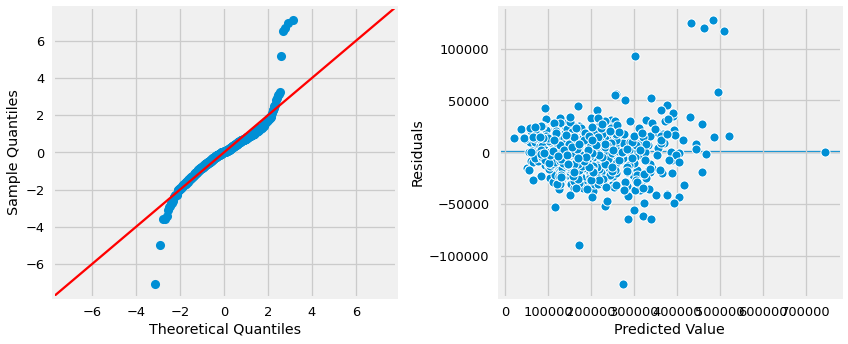

In [27]:
## instantiate an OLS model WITH the training data.
model_raw = sm.OLS(y_train, X_train_df)

## Fit the model and view the summary
result_raw = model_raw.fit()
sf.evaluate_ols(result_raw,X_train_df, y_train)

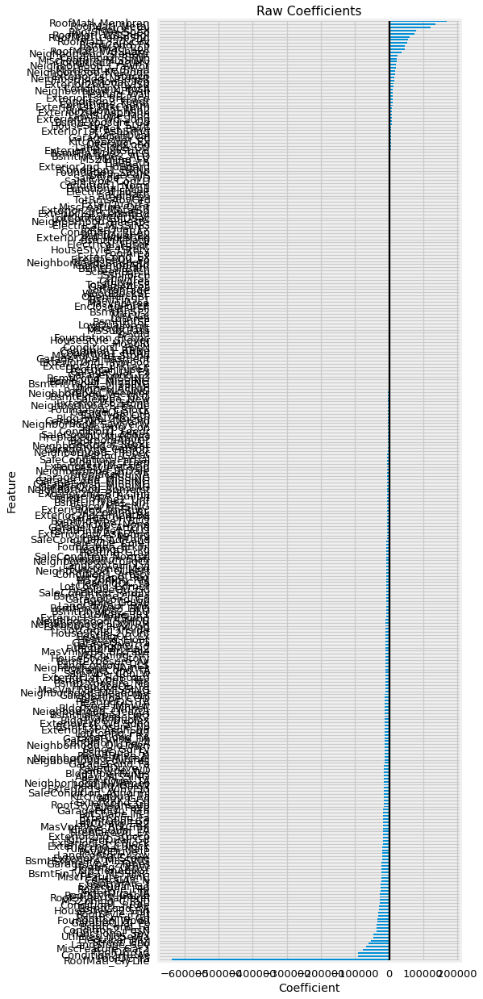

In [28]:
fig_raw = sf.plot_coeffs(result_raw, ohe_cols, include_const=True,title="Raw Coefficients",
                        figsize=(6,20))

In [29]:
nonohe_cols

['MSSubClass',
 'LotFrontage',
 'LotArea',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageYrBlt',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'MoSold',
 'YrSold',
 'MSZoning_C (all)',
 'MSZoning_FV',
 'MSZoning_RH',
 'MSZoning_RL',
 'MSZoning_RM',
 'Street_Grvl',
 'Street_Pave',
 'Alley_Grvl',
 'Alley_MISSING',
 'Alley_Pave',
 'LotShape_IR1',
 'LotShape_IR2',
 'LotShape_IR3',
 'LotShape_Reg',
 'LandContour_Bnk',
 'LandContour_HLS',
 'LandContour_Low',
 'LandContour_Lvl',
 'Utilities_AllPub',
 'LotConfig_Corner',
 'LotConfig_CulDSac',
 'LotConfig_FR2',
 'LotConfig_FR3',
 'LotConfig_Inside',
 'LandSlope_Gtl',
 'LandSlope_

/Users/codingdojo/Documents/GitHub/_CURRICULUM/curriculum-model-insights/stack_functions.py:148: UserWarning: [!] These features were not found in the params: ['Exterior2nd_Other']
  warnings.warn(f"[!] These features were not found in the params: {dne_cols}")


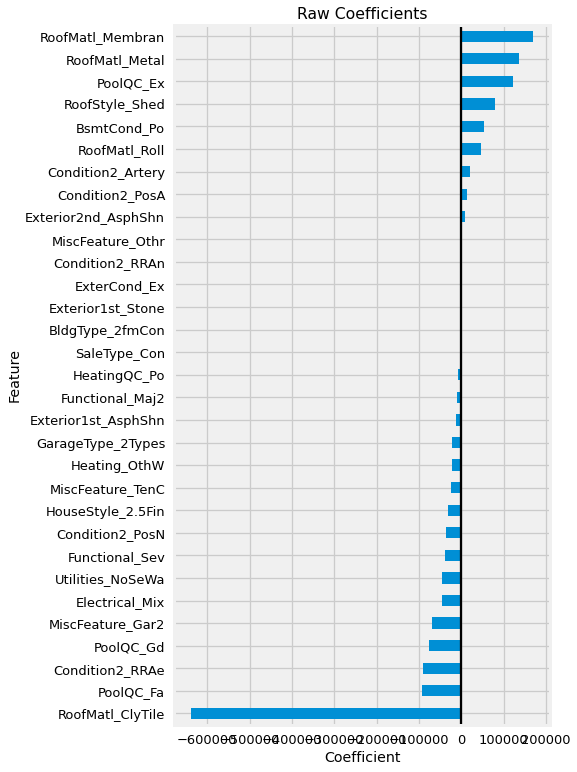

In [30]:
fig_raw_zips =sf.plot_coeffs(result_raw, nonohe_cols, figsize=(6,12),
                           include_const=True,title="Raw Coefficients")

### Raw Numeric - with Constant

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.950
Model:                            OLS   Adj. R-squared:                  0.936
Method:                 Least Squares   F-statistic:                     64.78
Date:                Wed, 22 Jun 2022   Prob (F-statistic):               0.00
Time:                        21:52:32   Log-Likelihood:                -12278.
No. Observations:                1095   AIC:                         2.506e+04
Df Residuals:                     844   BIC:                         2.631e+04
Df Model:                         250                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
MSSubClass              -40.0185    100.782     -0.397      0.691    -237.830     157.793
LotFrontage              23.1444     54.666      0.423      0.672     -84.153     130.442
LotArea                   1.0190      0.120      8.515      0.000       0.784       1.254
OverallQual            6252.3134   1082.318      5.777      0.000    4127.964    8376.663
OverallCond            5344.4931    963.208      5.549      0.000    3453.928    7235.058
YearBuilt               303.9819     83.512      3.640      0.000     140.067     467.897
YearRemodAdd             91.8302     58.630      1.566      0.118     -23.247     206.908
MasVnrArea               16.9141      5.999      2.819      0.005       5.139      28.689
BsmtFinSF1               17.7253      3.123      5.676      0.000      11.596      23.854
BsmtFinSF2                7.5151      6.454      1.164      0.245      -5.153      20.183
BsmtUnfSF                 0.0661      3.022      0.022      0.983      -5.865       5.997
TotalBsmtSF              25.3066      4.443      5.696      0.000      16.587      34.026
1stFlrSF                 14.0250      7.079      1.981      0.048       0.130      27.920
2ndFlrSF                 33.1447      6.126      5.410      0.000      21.121      45.169
LowQualFinSF            -14.8151     15.779     -0.939      0.348     -45.786      16.156
GrLivArea                32.3547      6.367      5.082      0.000      19.858      44.851
BsmtFullBath            428.6662   2140.362      0.200      0.841   -3772.391    4629.723
BsmtHalfBath             86.5513   3129.367      0.028      0.978   -6055.704    6228.807
FullBath               2079.6941   2395.163      0.868      0.385   -2621.481    6780.869
HalfBath               4046.6643   2313.244      1.749      0.081    -493.722    8587.051
BedroomAbvGr          -3985.4712   1456.518     -2.736      0.006   -6844.294   -1126.648
KitchenAbvGr          -2.225e+04   6383.917     -3.486      0.001   -3.48e+04   -9724.572
TotRmsAbvGrd           1860.2059   1018.756      1.826      0.068    -139.387    3859.799
Fireplaces             1971.3312   2724.214      0.724      0.469   -3375.699    7318.361
GarageYrBlt             -35.6391     66.960     -0.532      0.595    -167.066      95.788
GarageCars             3498.0431   2414.565      1.449      0.148   -1241.213    8237.300
GarageArea               24.8692      8.331      2.985      0.003       8.517      41.221
WoodDeckSF               21.1595      6.370      3.322      0.001       8.657      33.662
OpenPorchSF              20.6168     12.214      1.688      0.092      -3.357      44.591
EnclosedPorch            16.5498     13.283      1.246      0.213      -9.522      42.622
3SsnPorch                45.2815     22.132      2.046      0.041       1.841      88.722
ScreenPorch            

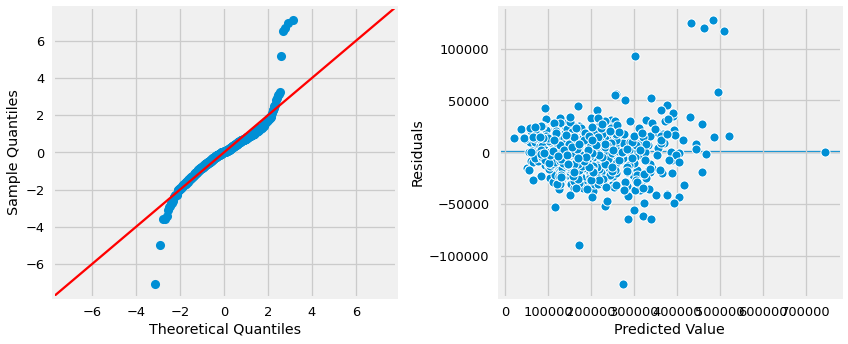

In [31]:
## instantiate an OLS model WITH the training data.
model_raw_cnst = sm.OLS(y_train, X_train_df_cnst)

## Fit the model and view the summary
result_raw_cnst = model_raw_cnst.fit()
sf.evaluate_ols(result_raw_cnst,X_train_df_cnst, y_train)

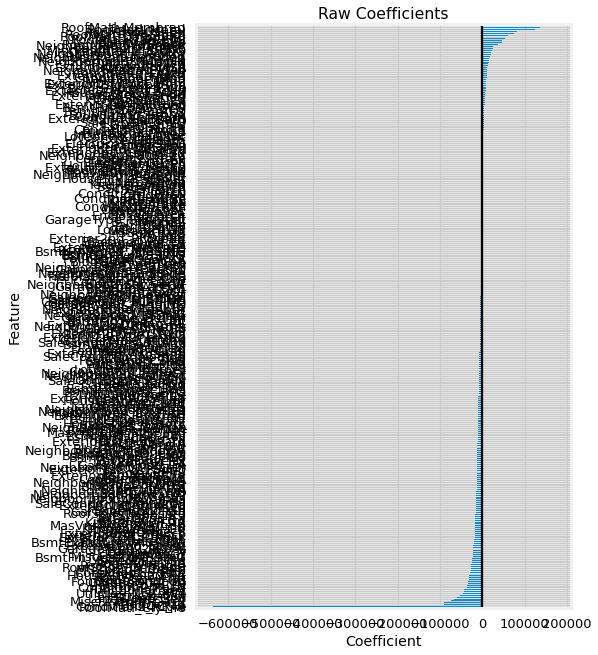

In [32]:
fig_raw =sf.plot_coeffs(result_raw_cnst, ohe_cols, include_const=True,title="Raw Coefficients")

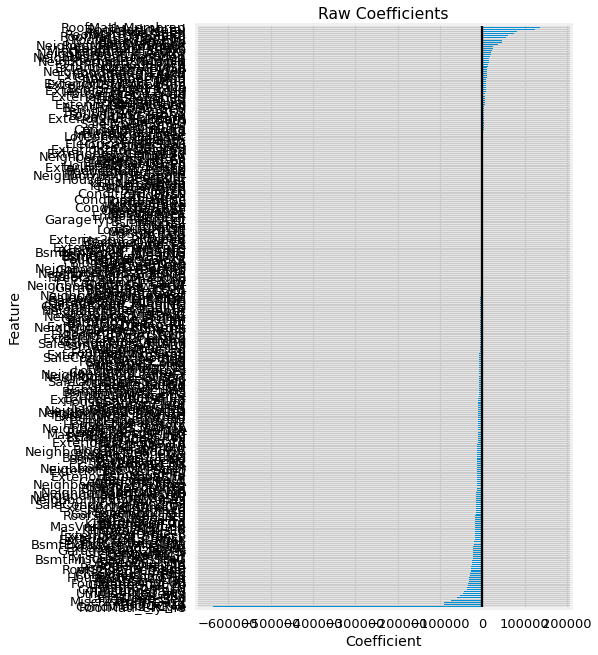

In [33]:
fig_raw =sf.plot_coeffs(result_raw_cnst, ohe_cols, include_const=False,title="Raw Coefficients")

/Users/codingdojo/Documents/GitHub/_CURRICULUM/curriculum-model-insights/stack_functions.py:148: UserWarning: [!] These features were not found in the params: ['Exterior2nd_Other']
  warnings.warn(f"[!] These features were not found in the params: {dne_cols}")


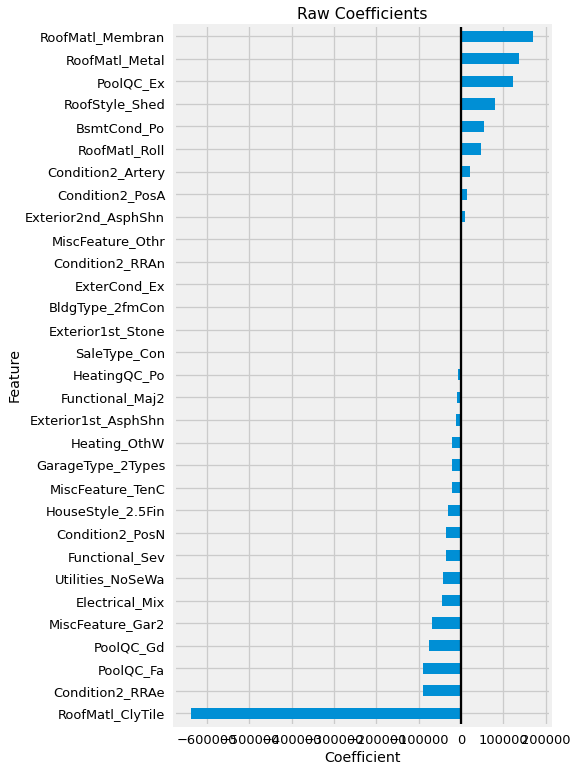

In [34]:
fig_raw_zips =sf.plot_coeffs(result_raw_cnst, nonohe_cols, figsize=(6,12),include_const=False,title="Raw Coefficients")

### Scaled Numeric - No Constant

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.950
Model:                            OLS   Adj. R-squared:                  0.936
Method:                 Least Squares   F-statistic:                     64.78
Date:                Wed, 22 Jun 2022   Prob (F-statistic):               0.00
Time:                        21:52:36   Log-Likelihood:                -12278.
No. Observations:                1095   AIC:                         2.506e+04
Df Residuals:                     844   BIC:                         2.631e+04
Df Model:                         250                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
MSSubClass            -1682.6670   4237.587     -0.397      0.691      -1e+04    6634.779
LotFrontage             474.5519   1120.869      0.423      0.672   -1725.467    2674.570
LotArea                1.123e+04   1318.967      8.515      0.000    8642.244    1.38e+04
OverallQual            8701.9061   1506.358      5.777      0.000    5745.258    1.17e+04
OverallCond            5943.9117   1071.238      5.549      0.000    3841.308    8046.515
YearBuilt              9205.1807   2528.900      3.640      0.000    4241.509    1.42e+04
YearRemodAdd           1912.9980   1221.373      1.566      0.118    -484.286    4310.282
MasVnrArea             3080.5974   1092.640      2.819      0.005     935.988    5225.207
BsmtFinSF1             8951.2207   1172.126      7.637      0.000    6650.596    1.13e+04
BsmtFinSF2             1548.5587   1361.177      1.138      0.256   -1123.131    4220.248
BsmtUnfSF               835.7140   1006.250      0.831      0.406   -1139.332    2810.760
TotalBsmtSF            1.052e+04   1635.155      6.433      0.000    7308.765    1.37e+04
1stFlrSF               5851.0380   1806.005      3.240      0.001    2306.251    9395.826
2ndFlrSF               1.478e+04   1829.386      8.077      0.000    1.12e+04    1.84e+04
LowQualFinSF           -605.6178    912.125     -0.664      0.507   -2395.916    1184.681
GrLivArea              1.654e+04   1421.129     11.636      0.000    1.37e+04    1.93e+04
BsmtFullBath            222.9751   1113.331      0.200      0.841   -1962.247    2408.197
BsmtHalfBath             21.3935    773.507      0.028      0.978   -1496.829    1539.616
FullBath               1154.4589   1329.579      0.868      0.385   -1455.210    3764.128
HalfBath               2048.0871   1170.773      1.749      0.081    -249.881    4346.056
BedroomAbvGr          -3260.5819   1191.602     -2.736      0.006   -5599.434    -921.730
KitchenAbvGr          -4836.5162   1387.383     -3.486      0.001   -7559.642   -2113.390
TotRmsAbvGrd           3029.1390   1658.931      1.826      0.068    -226.976    6285.254
Fireplaces             1283.6219   1773.858      0.724      0.469   -2198.069    4765.312
GarageYrBlt            -865.2069   1625.570     -0.532      0.595   -4055.841    2325.427
GarageCars             2579.2308   1780.344      1.449      0.148    -915.190    6073.652
GarageArea             5244.9049   1757.001      2.985      0.003    1796.302    8693.508
WoodDeckSF             2674.1439    805.046      3.322      0.001    1094.016    4254.272
OpenPorchSF            1361.0677    806.351      1.688      0.092    -221.621    2943.757
EnclosedPorch          1028.9572    825.851      1.246      0.213    -592.005    2649.920
3SsnPorch              1424.0517    696.025      2.046      0.041      57.910    2790.194
ScreenPorch            

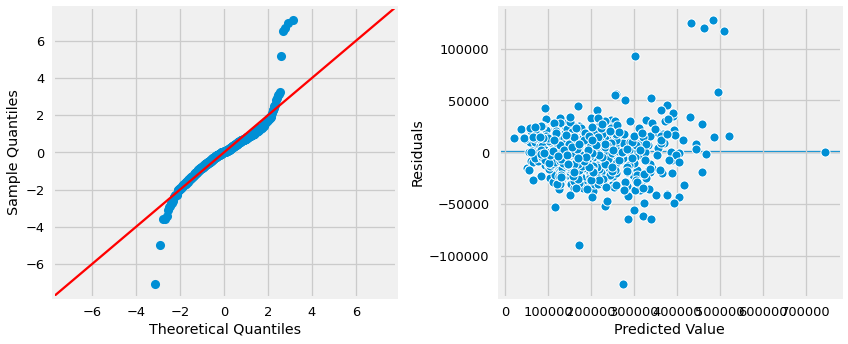

In [35]:
## instantiate an OLS model WITH the training data.
model_scaled = sm.OLS(y_train, X_train_scaled_df)

## Fit the model and view the summary
result_scaled = model_scaled.fit()
sf.evaluate_ols(result_scaled,X_train_scaled_df, y_train)

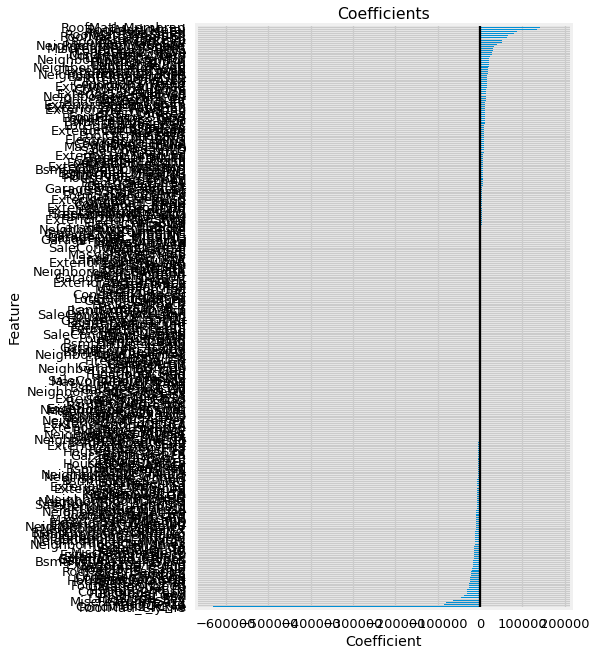

In [36]:
fig_scaled =sf.plot_coeffs(result_scaled,ohe_cols,include_const=True)

/Users/codingdojo/Documents/GitHub/_CURRICULUM/curriculum-model-insights/stack_functions.py:148: UserWarning: [!] These features were not found in the params: ['Exterior2nd_Other']
  warnings.warn(f"[!] These features were not found in the params: {dne_cols}")


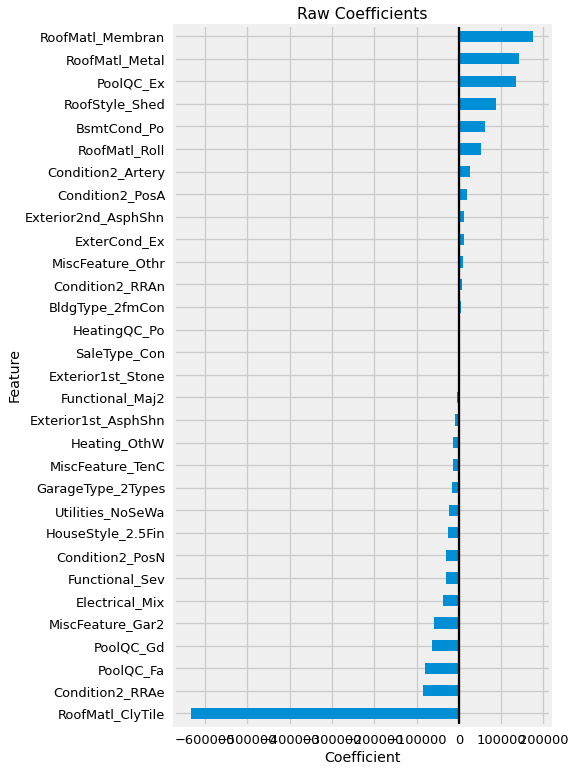

In [37]:
fig_scaled_zips =sf.plot_coeffs(result_scaled, nonohe_cols, figsize=(6,12),include_const=True,title="Raw Coefficients")

### Scaled Numeric - with Constant

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.950
Model:                            OLS   Adj. R-squared:                  0.936
Method:                 Least Squares   F-statistic:                     64.78
Date:                Wed, 22 Jun 2022   Prob (F-statistic):               0.00
Time:                        21:52:38   Log-Likelihood:                -12278.
No. Observations:                1095   AIC:                         2.506e+04
Df Residuals:                     844   BIC:                         2.631e+04
Df Model:                         250                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
MSSubClass            -1682.6670   4237.587     -0.397      0.691      -1e+04    6634.779
LotFrontage             474.5519   1120.869      0.423      0.672   -1725.467    2674.570
LotArea                1.123e+04   1318.967      8.515      0.000    8642.244    1.38e+04
OverallQual            8701.9061   1506.358      5.777      0.000    5745.258    1.17e+04
OverallCond            5943.9117   1071.238      5.549      0.000    3841.308    8046.515
YearBuilt              9205.1807   2528.900      3.640      0.000    4241.509    1.42e+04
YearRemodAdd           1912.9980   1221.373      1.566      0.118    -484.286    4310.282
MasVnrArea             3080.5974   1092.640      2.819      0.005     935.988    5225.207
BsmtFinSF1             8951.2207   1172.126      7.637      0.000    6650.596    1.13e+04
BsmtFinSF2             1548.5587   1361.177      1.138      0.256   -1123.131    4220.248
BsmtUnfSF               835.7140   1006.250      0.831      0.406   -1139.332    2810.760
TotalBsmtSF            1.052e+04   1635.155      6.433      0.000    7308.765    1.37e+04
1stFlrSF               5851.0380   1806.005      3.240      0.001    2306.251    9395.826
2ndFlrSF               1.478e+04   1829.386      8.077      0.000    1.12e+04    1.84e+04
LowQualFinSF           -605.6178    912.125     -0.664      0.507   -2395.916    1184.681
GrLivArea              1.654e+04   1421.129     11.636      0.000    1.37e+04    1.93e+04
BsmtFullBath            222.9751   1113.331      0.200      0.841   -1962.247    2408.197
BsmtHalfBath             21.3935    773.507      0.028      0.978   -1496.829    1539.616
FullBath               1154.4589   1329.579      0.868      0.385   -1455.210    3764.128
HalfBath               2048.0871   1170.773      1.749      0.081    -249.881    4346.056
BedroomAbvGr          -3260.5819   1191.602     -2.736      0.006   -5599.434    -921.730
KitchenAbvGr          -4836.5162   1387.383     -3.486      0.001   -7559.642   -2113.390
TotRmsAbvGrd           3029.1390   1658.931      1.826      0.068    -226.976    6285.254
Fireplaces             1283.6219   1773.858      0.724      0.469   -2198.069    4765.312
GarageYrBlt            -865.2069   1625.570     -0.532      0.595   -4055.841    2325.427
GarageCars             2579.2308   1780.344      1.449      0.148    -915.190    6073.652
GarageArea             5244.9049   1757.001      2.985      0.003    1796.302    8693.508
WoodDeckSF             2674.1439    805.046      3.322      0.001    1094.016    4254.272
OpenPorchSF            1361.0677    806.351      1.688      0.092    -221.621    2943.757
EnclosedPorch          1028.9572    825.851      1.246      0.213    -592.005    2649.920
3SsnPorch              1424.0517    696.025      2.046      0.041      57.910    2790.194
ScreenPorch            

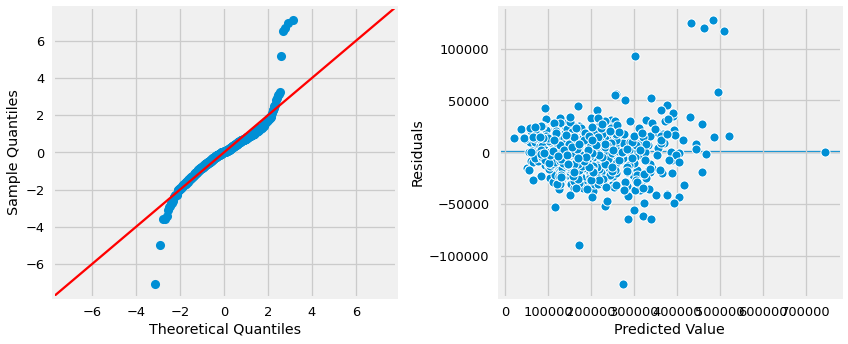

In [38]:
## instantiate an OLS model WITH the training data.
model_scaled_cnst = sm.OLS(y_train, X_train_scaled_df_cnst)

## Fit the model and view the summary
result_scaled_cnst = model_scaled_cnst.fit()
sf.evaluate_ols(result_scaled_cnst,X_train_scaled_df_cnst, y_train)

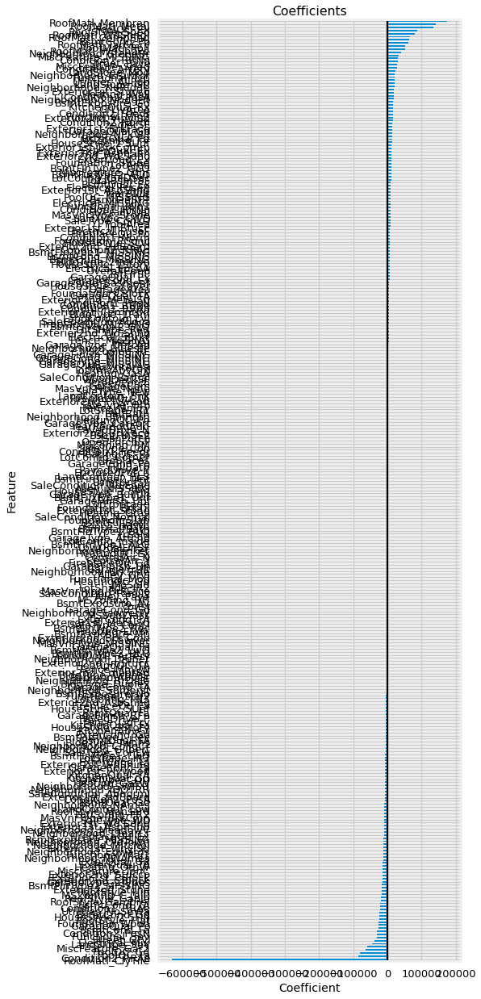

In [85]:
fig_scaled =sf.plot_coeffs(result_scaled_cnst,ohe_cols,include_const=True,
                           figsize=(6,20))

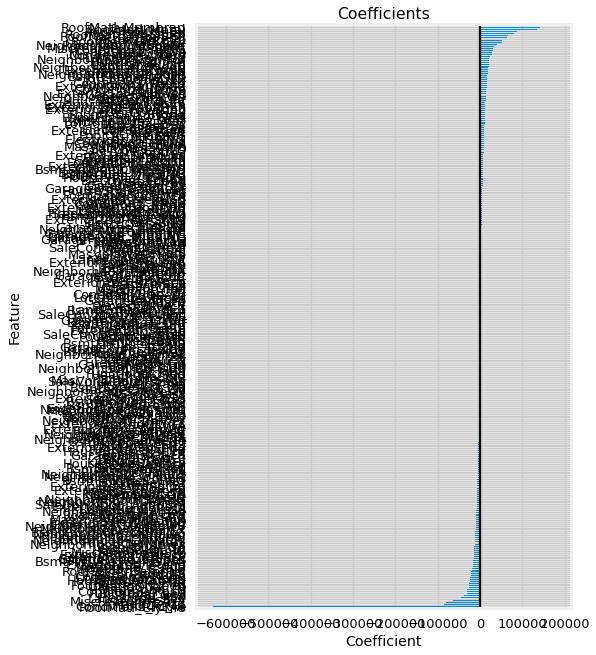

In [40]:
fig_scaled =sf.plot_coeffs(result_scaled_cnst,ohe_cols,include_const=False)

/Users/codingdojo/Documents/GitHub/_CURRICULUM/curriculum-model-insights/stack_functions.py:148: UserWarning: [!] These features were not found in the params: ['Exterior2nd_Other']
  warnings.warn(f"[!] These features were not found in the params: {dne_cols}")


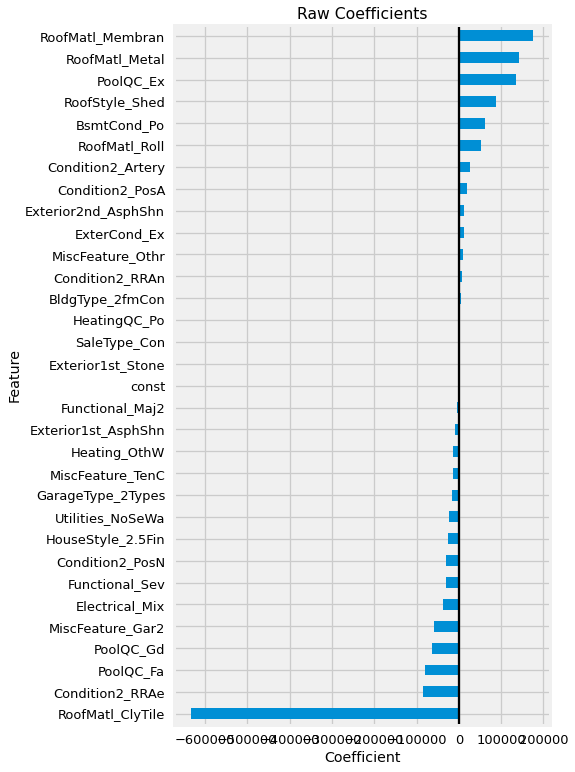

In [41]:
fig_scaled_zips =sf.plot_coeffs(result_scaled_cnst, nonohe_cols, figsize=(6,12),include_const=True,title="Raw Coefficients")

## Modeling - No Outliers

### Raw Numeric - No Constant

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.952
Model:                            OLS   Adj. R-squared:                  0.934
Method:                 Least Squares   F-statistic:                     52.53
Date:                Wed, 22 Jun 2022   Prob (F-statistic):          3.51e-277
Time:                        21:52:41   Log-Likelihood:                -8546.8
No. Observations:                 777   AIC:                         1.752e+04
Df Residuals:                     562   BIC:                         1.852e+04
Df Model:                         214                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
MSSubClass             -309.5192    172.845     -1.791      0.074    -649.021      29.982
LotFrontage             -12.5205     50.598     -0.247      0.805    -111.905      86.864
LotArea                   1.2164      0.337      3.612      0.000       0.555       1.878
OverallQual            5432.7580   1164.134      4.667      0.000    3146.174    7719.342
OverallCond            5156.4516   1101.026      4.683      0.000    2993.822    7319.081
YearBuilt               335.0913     97.084      3.452      0.001     144.400     525.783
YearRemodAdd            149.7234     69.041      2.169      0.031      14.113     285.334
MasVnrArea               13.0690      7.167      1.823      0.069      -1.009      27.147
BsmtFinSF1               16.0562      6.153      2.609      0.009       3.970      28.143
BsmtFinSF2                9.9264     17.039      0.583      0.560     -23.541      43.394
BsmtUnfSF                -3.9153      6.364     -0.615      0.539     -16.415       8.584
TotalBsmtSF              22.0673      7.276      3.033      0.003       7.776      36.359
1stFlrSF                 14.2176     40.284      0.353      0.724     -64.908      93.343
2ndFlrSF                 35.1019     39.703      0.884      0.377     -42.882     113.086
LowQualFinSF            -11.6345    118.910     -0.098      0.922    -245.197     221.928
GrLivArea                37.6848     39.713      0.949      0.343     -40.319     115.688
BsmtFullBath           1246.9326   2264.584      0.551      0.582   -3201.151    5695.016
BsmtHalfBath           9.425e-06   5.52e-06      1.708      0.088   -1.42e-06    2.03e-05
FullBath                -67.8681   2760.255     -0.025      0.980   -5489.545    5353.809
HalfBath              -2062.9760   2651.894     -0.778      0.437   -7271.811    3145.859
BedroomAbvGr           -911.1857   1718.395     -0.530      0.596   -4286.446    2464.075
KitchenAbvGr          -1.645e+05   9.65e+04     -1.705      0.089   -3.54e+05     2.5e+04
TotRmsAbvGrd          -1125.1716   1083.824     -1.038      0.300   -3254.011    1003.668
Fireplaces             2016.6683   3336.629      0.604      0.546   -4537.119    8570.456
GarageYrBlt              70.6142     75.016      0.941      0.347     -76.731     217.960
GarageCars             3706.6160   2573.288      1.440      0.150   -1347.822    8761.054
GarageArea               11.2778      9.057      1.245      0.214      -6.511      29.067
WoodDeckSF               21.2311      7.760      2.736      0.006       5.989      36.473
OpenPorchSF              40.4732     15.528      2.606      0.009       9.972      70.974
EnclosedPorch            19.8182     19.109      1.037      0.300     -17.716      57.353
3SsnPorch              -603.0607    813.091     -0.742      0.459   -2200.129     994.008
ScreenPorch            

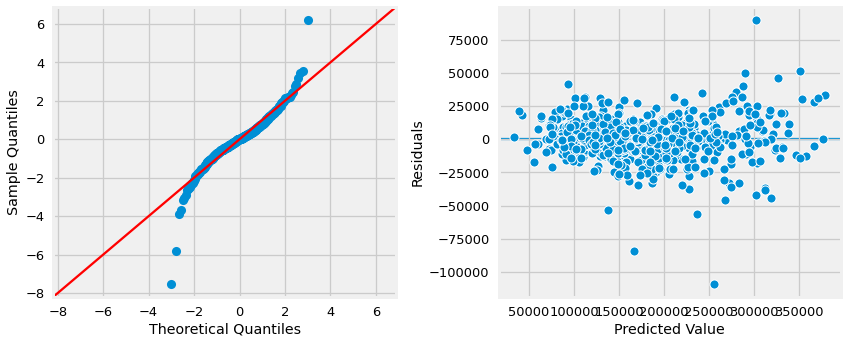

In [42]:
## instantiate an OLS model WITH the training data.
model_cln = sm.OLS(y_train_cln, X_train_df_cln)

## Fit the model and view the summary
result_cln = model_cln.fit()
sf.evaluate_ols(result_cln,X_train_df_cln, y_train_cln)

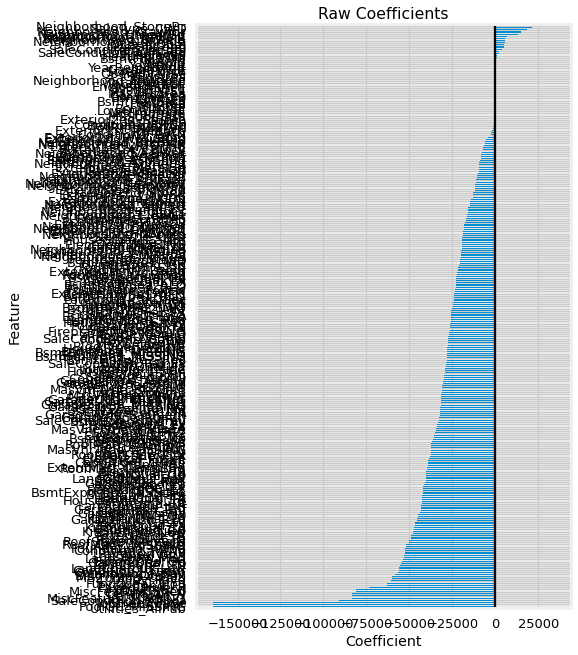

In [43]:
fig_raw =sf.plot_coeffs(result_cln, ohe_cols, include_const=True,title="Raw Coefficients")

In [44]:
fig_raw_zips =sf.plot_coeffs(result_cln, nonohe_cols, figsize=(6,12),include_const=True,title="Raw Coefficients")

/Users/codingdojo/Documents/GitHub/_CURRICULUM/curriculum-model-insights/stack_functions.py:159: UserWarning: 
[!] There were no coefficients to plot.
  warnings.warn("\n[!] There were no coefficients to plot.")


### Raw Numeric - with Constant

In [45]:
X_train_df_cln_cnst.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_MISSING,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,...,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_MISSING,GarageFinish_Fin,GarageFinish_MISSING,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Ex,GarageQual_Fa,GarageQual_Gd,GarageQual_MISSING,GarageQual_Po,GarageQual_TA,GarageCond_Ex,GarageCond_Fa,GarageCond_Gd,GarageCond_MISSING,GarageCond_Po,GarageCond_TA,PavedDrive_N,PavedDrive_P,PavedDrive_Y,PoolQC_MISSING,Fence_GdPrv,Fence_GdWo,Fence_MISSING,Fence_MnPrv,Fence_MnWw,MiscFeature_MISSING,MiscFeature_Shed,SaleType_COD,SaleType_CWD,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,const
count,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.0,777.000000,777.000000,777.000000,777.0,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.0,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,...,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.0,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.0
mean,54.362934,68.489860,9151.311454,6.066924,5.522523,1974.952381,1985.936937,94.445019,420.831403,17.199485,573.253539,1011.284427,1103.920206,329.920206,0.274131,1434.114543,0.406692,0.0,1.548263,0.382239,2.788932,1.0,6.277992,0.568855,1980.620924,1.750322,463.893179,85.458172,41.351351,15.648649,0.029601,6.205920,0.0,14.226512,6.253539,2007.837838,0.006435,0.059202,0.009009,0.772201,0.153153,0.002574,0.997426,0.034749,0.936937,0.028314,0.321750,0.020592,0.006435,0.651223,...,0.015444,0.216216,0.612613,0.015444,0.060489,0.001287,0.257400,0.052767,0.257400,0.052767,0.301158,0.388674,0.002574,0.028314,0.005148,0.052767,0.001287,0.909910,0.002574,0.023166,0.005148,0.052767,0.003861,0.912484,0.051480,0.021879,0.926641,1.0,0.037323,0.039897,0.813385,0.104247,0.005148,0.975547,0.024453,0.023166,0.002574,0.003861,0.003861,0.003861,0.077220,0.002574,0.882883,0.068211,0.002574,0.002574,0.014157,0.832690,0.079794,1.0
std,40.199401,21.947987,3720.366099,1.350124,0.989543,28.999805,20.610149,158.976555,407.571581,72.513508,413.025836,369.498570,337.280075,412.393515,4.476544,447.690078,0.491533,0.0,0.518274,0.486248,0.715607,0.0,1.451960,0.599147,23.865744,0.735305,203.622845,107.578495,52.853389,44.728607,0.825120,29.195684,0.0,104.199552,2.690919,1.352531,0.080011,0.236155,0.094548,0.419683,0.360367,0.050702,0.050702,0.183261,0.243233,0.165975,0.467449,0.142106,0.080011,0.476890,...,0.123390,0.411929,0.487467,0.123390,0.238544,0.035875,0.437483,0.223712,0.437483,0.223712,0.459057,0.487763,0.050702,0.165975,0.071611,0.223712,0.035875,0.

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.952
Model:                            OLS   Adj. R-squared:                  0.934
Method:                 Least Squares   F-statistic:                     52.53
Date:                Wed, 22 Jun 2022   Prob (F-statistic):          3.51e-277
Time:                        21:52:43   Log-Likelihood:                -8546.8
No. Observations:                 777   AIC:                         1.752e+04
Df Residuals:                     562   BIC:                         1.852e+04
Df Model:                         214                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
MSSubClass             -309.5192    172.845     -1.791      0.074    -649.021      29.982
LotFrontage             -12.5205     50.598     -0.247      0.805    -111.905      86.864
LotArea                   1.2164      0.337      3.612      0.000       0.555       1.878
OverallQual            5432.7580   1164.134      4.667      0.000    3146.174    7719.342
OverallCond            5156.4516   1101.026      4.683      0.000    2993.822    7319.081
YearBuilt               335.0913     97.084      3.452      0.001     144.400     525.783
YearRemodAdd            149.7234     69.041      2.169      0.031      14.113     285.334
MasVnrArea               13.0690      7.167      1.823      0.069      -1.009      27.147
BsmtFinSF1               16.0562      6.153      2.609      0.009       3.970      28.143
BsmtFinSF2                9.9264     17.039      0.583      0.560     -23.541      43.394
BsmtUnfSF                -3.9153      6.364     -0.615      0.539     -16.415       8.584
TotalBsmtSF              22.0673      7.276      3.033      0.003       7.776      36.359
1stFlrSF                 14.2177     40.284      0.353      0.724     -64.908      93.343
2ndFlrSF                 35.1019     39.703      0.884      0.377     -42.882     113.086
LowQualFinSF            -11.6344    118.910     -0.098      0.922    -245.197     221.928
GrLivArea                37.6847     39.713      0.949      0.343     -40.319     115.688
BsmtFullBath           1246.9326   2264.584      0.551      0.582   -3201.151    5695.016
BsmtHalfBath          -5.987e-06   3.51e-06     -1.707      0.088   -1.29e-05    9.03e-07
FullBath                -67.8681   2760.255     -0.025      0.980   -5489.545    5353.809
HalfBath              -2062.9760   2651.894     -0.778      0.437   -7271.811    3145.859
BedroomAbvGr           -911.1857   1718.395     -0.530      0.596   -4286.446    2464.075
KitchenAbvGr          -1.521e+05   8.92e+04     -1.705      0.089   -3.27e+05    2.31e+04
TotRmsAbvGrd          -1125.1716   1083.824     -1.038      0.300   -3254.011    1003.668
Fireplaces             2016.6683   3336.629      0.604      0.546   -4537.119    8570.456
GarageYrBlt              70.6142     75.016      0.941      0.347     -76.731     217.960
GarageCars             3706.6160   2573.288      1.440      0.150   -1347.822    8761.054
GarageArea               11.2778      9.057      1.245      0.214      -6.511      29.067
WoodDeckSF               21.2311      7.760      2.736      0.006       5.989      36.473
OpenPorchSF              40.4732     15.528      2.606      0.009       9.972      70.974
EnclosedPorch            19.8182     19.109      1.037      0.300     -17.716      57.353
3SsnPorch              -603.0607    813.091     -0.742      0.459   -2200.129     994.008
ScreenPorch            

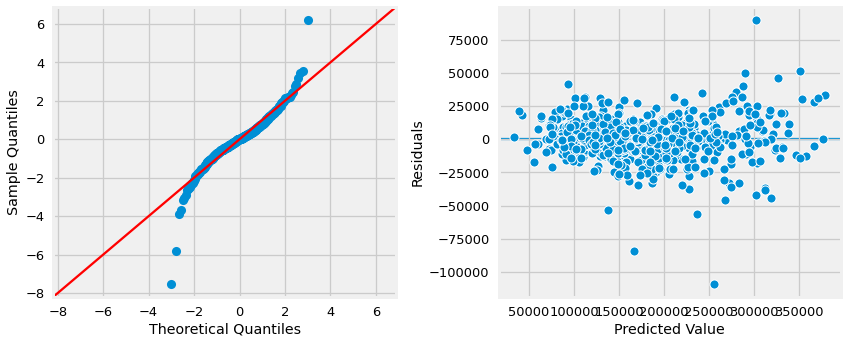

In [46]:
## instantiate an OLS model WITH the training data.
model_cln_cnst = sm.OLS(y_train_cln, X_train_df_cln_cnst)

## Fit the model and view the summary
result_cln_cnst = model_cln_cnst.fit()
sf.evaluate_ols(result_cln_cnst,X_train_df_cln_cnst, y_train_cln)

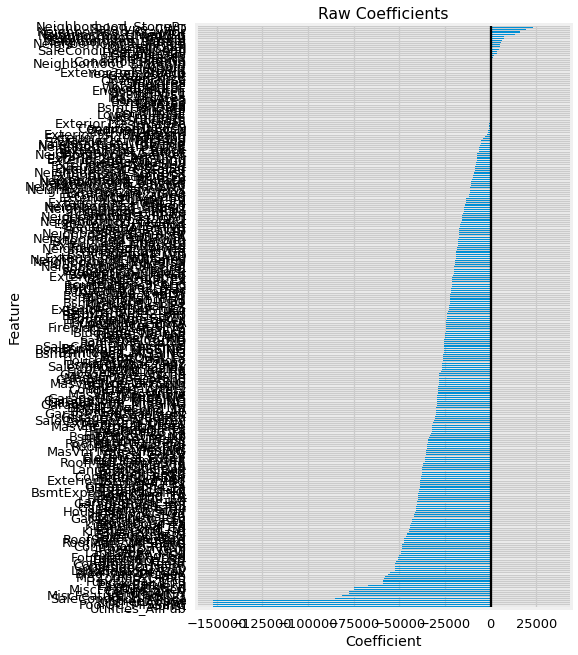

In [47]:
fig_raw =sf.plot_coeffs(result_cln_cnst, ohe_cols, include_const=True,title="Raw Coefficients")

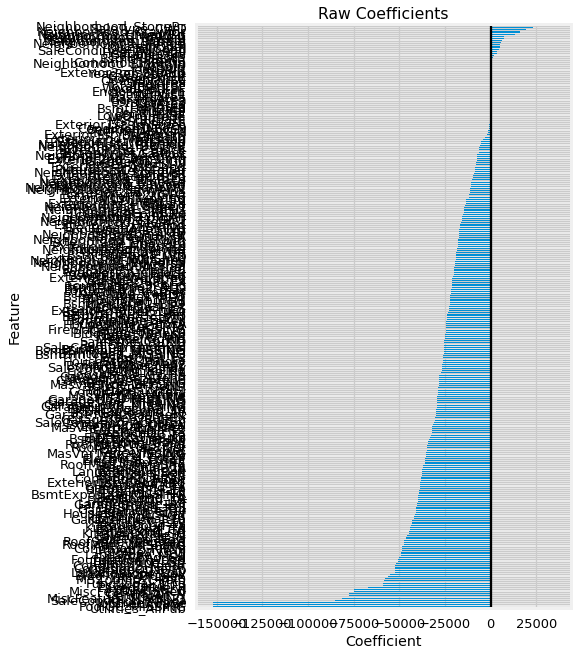

In [48]:
fig_raw =sf.plot_coeffs(result_cln_cnst, ohe_cols, include_const=False,title="Raw Coefficients")

In [49]:
fig_raw_zips =sf.plot_coeffs(result_cln_cnst, nonohe_cols, figsize=(6,12),include_const=True,title="Raw Coefficients")

/Users/codingdojo/Documents/GitHub/_CURRICULUM/curriculum-model-insights/stack_functions.py:159: UserWarning: 
[!] There were no coefficients to plot.
  warnings.warn("\n[!] There were no coefficients to plot.")


### Scaled Numeric - No Constant

In [50]:
X_train_scaled_df_cln.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_MISSING,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,...,FireplaceQu_MISSING,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_MISSING,GarageFinish_Fin,GarageFinish_MISSING,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Ex,GarageQual_Fa,GarageQual_Gd,GarageQual_MISSING,GarageQual_Po,GarageQual_TA,GarageCond_Ex,GarageCond_Fa,GarageCond_Gd,GarageCond_MISSING,GarageCond_Po,GarageCond_TA,PavedDrive_N,PavedDrive_P,PavedDrive_Y,PoolQC_MISSING,Fence_GdPrv,Fence_GdWo,Fence_MISSING,Fence_MnPrv,Fence_MnWw,MiscFeature_MISSING,MiscFeature_Shed,SaleType_COD,SaleType_CWD,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
count,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,777.0,7.770000e+02,7.770000e+02,7.770000e+02,777.0,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,777.0,7.770000e+02,7.770000e+02,7.770000e+02,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,...,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.0,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000
mean,2.743408e-17,7.772990e-17,2.446206e-16,2.994887e-16,2.972026e-17,-3.772186e-16,-3.932218e-16,4.572347e-18,-5.944051e-17,3.657878e-17,1.165949e-16,1.234534e-16,-6.515595e-17,-4.572347e-17,1.371704e-17,1.646045e-16,7.430064e-18,0.0,-1.371704e-17,-5.944051e-17,-1.828939e-16,0.0,-2.194727e-16,-2.743408e-17,8.757188e-15,3.200643e-17,-8.916077e-17,9.144694e-18,-6.858521e-17,2.057556e-17,-1.600321e-17,5.486816e-17,0.0,-4.572347e-18,2.286174e-18,-6.366536e-14,0.006435,0.059202,0.009009,0.772201,0.153153,0.002574,0.997426,0.034749,0.936937,0.028314,0.321750,0.020592,0.006435,0.651223,...,0.487773,0.015444,0.216216,0.612613,0.015444,0.060489,0.001287,0.257400,0.052767,0.257400,0.052767,0.301158,0.388674,0.002574,0.028314,0.005148,0.052767,0.001287,0.909910,0.002574,0.023166,0.005148,0.052767,0.003861,0.912484,0.051480,0.021879,0.926641,1.0,0.037323,0.039897,0.813385,0.104247,0.005148,0.975547,0.024453,0.023166,0.002574,0.003861,0.003861,0.003861,0.077220,0.002574,0.882883,0.068211,0.002574,0.002574,0.014157,0.832690,0.079794
std,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,0.0,1.000644e+00,1.000644e+00,1.000644e+00,0.0,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,0.0,1.000644e+00,1.000644e+00,1

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.952
Model:                            OLS   Adj. R-squared:                  0.934
Method:                 Least Squares   F-statistic:                     52.53
Date:                Wed, 22 Jun 2022   Prob (F-statistic):          3.51e-277
Time:                        21:52:47   Log-Likelihood:                -8546.8
No. Observations:                 777   AIC:                         1.752e+04
Df Residuals:                     562   BIC:                         1.852e+04
Df Model:                         214                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
MSSubClass            -1.243e+04   6943.798     -1.791      0.074   -2.61e+04    1204.487
LotFrontage            -274.6226   1109.807     -0.247      0.805   -2454.499    1905.254
LotArea                4522.4108   1252.181      3.612      0.000    2062.885    6981.937
OverallQual            7330.1758   1570.713      4.667      0.000    4244.990    1.04e+04
OverallCond            5099.2469   1088.812      4.683      0.000    2960.609    7237.884
YearBuilt              9711.3277   2813.600      3.452      0.001    4184.871    1.52e+04
YearRemodAdd           3083.8350   1422.034      2.169      0.031     290.684    5876.986
MasVnrArea             2076.3260   1138.699      1.823      0.069    -160.299    4312.951
BsmtFinSF1             7358.1994   1116.724      6.589      0.000    5164.737    9551.661
BsmtFinSF2              864.9336   1627.527      0.531      0.595   -2331.846    4061.713
BsmtUnfSF              -786.7721   1043.679     -0.754      0.451   -2836.761    1263.217
TotalBsmtSF            7406.6732   1694.664      4.371      0.000    4078.024    1.07e+04
1stFlrSF               4768.6835   1858.488      2.566      0.011    1118.253    8419.114
2ndFlrSF               1.444e+04   1971.550      7.323      0.000    1.06e+04    1.83e+04
LowQualFinSF            -52.3611    709.049     -0.074      0.941   -1445.071    1340.349
GrLivArea              1.689e+04   1493.060     11.313      0.000     1.4e+04    1.98e+04
BsmtFullBath            612.5139   1112.401      0.551      0.582   -1572.458    2797.486
BsmtHalfBath           2.197e-10   1.22e-10      1.804      0.072   -1.95e-11    4.59e-10
FullBath                -35.1517   1429.649     -0.025      0.980   -2843.260    2772.956
HalfBath              -1002.4714   1288.647     -0.778      0.437   -3533.625    1528.682
BedroomAbvGr           -651.6314   1228.904     -0.530      0.596   -3065.438    1762.175
KitchenAbvGr          -4.832e-11      2e-10     -0.241      0.809   -4.41e-10    3.45e-10
TotRmsAbvGrd          -1632.6525   1572.655     -1.038      0.300   -4721.653    1456.348
Fireplaces             1207.5030   1997.845      0.604      0.546   -2716.651    5131.658
GarageYrBlt            1684.1762   1789.153      0.941      0.347   -1830.068    5198.420
GarageCars             2723.7383   1890.933      1.440      0.150    -990.422    6437.898
GarageArea             2294.9423   1842.951      1.245      0.214   -1324.971    5914.856
WoodDeckSF             2282.5376    834.243      2.736      0.006     643.923    3921.153
OpenPorchSF            2137.7668    820.201      2.606      0.009     526.733    3748.801
EnclosedPorch           885.8678    854.186      1.037      0.300    -791.919    2563.654
3SsnPorch              -497.2773    670.466     -0.742      0.459   -1814.203     819.648
ScreenPorch            

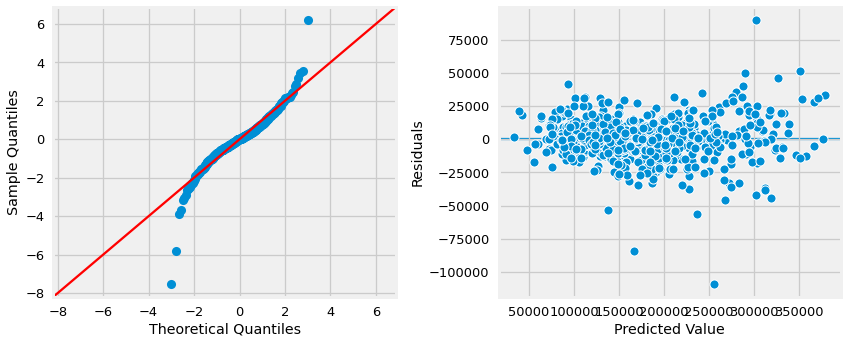

In [51]:
## instantiate an OLS model WITH the training data.
model_cln_scaled = sm.OLS(y_train_cln, X_train_scaled_df_cln)

## Fit the model and view the summary
result_cln_scaled = model_cln_scaled.fit()
sf.evaluate_ols(result_cln_scaled,X_train_scaled_df_cln, y_train_cln)

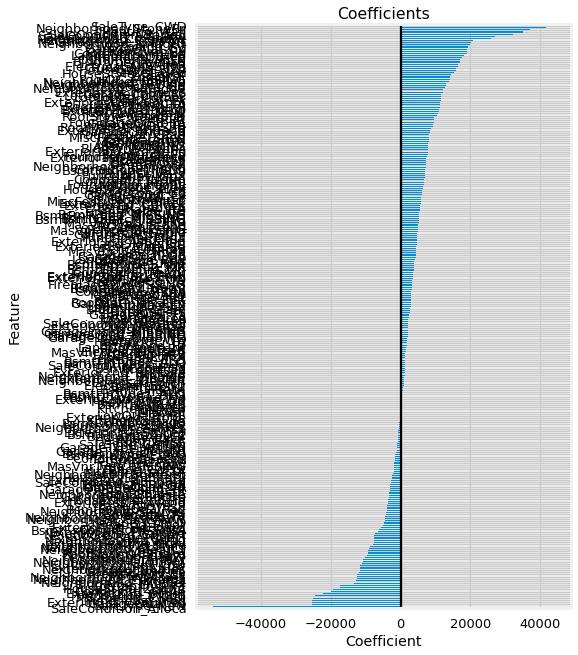

In [52]:
fig_scaled =sf.plot_coeffs(result_cln_scaled,ohe_cols,include_const=True)

In [53]:
fig_scaled_zips =sf.plot_coeffs(result_cln_scaled, nonohe_cols, figsize=(6,12),include_const=True,title="Raw Coefficients")

/Users/codingdojo/Documents/GitHub/_CURRICULUM/curriculum-model-insights/stack_functions.py:159: UserWarning: 
[!] There were no coefficients to plot.
  warnings.warn("\n[!] There were no coefficients to plot.")


### Scaled Numeric - with Constant

In [54]:
X_train_scaled_df_cln_cnst.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_MISSING,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,...,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_MISSING,GarageFinish_Fin,GarageFinish_MISSING,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Ex,GarageQual_Fa,GarageQual_Gd,GarageQual_MISSING,GarageQual_Po,GarageQual_TA,GarageCond_Ex,GarageCond_Fa,GarageCond_Gd,GarageCond_MISSING,GarageCond_Po,GarageCond_TA,PavedDrive_N,PavedDrive_P,PavedDrive_Y,PoolQC_MISSING,Fence_GdPrv,Fence_GdWo,Fence_MISSING,Fence_MnPrv,Fence_MnWw,MiscFeature_MISSING,MiscFeature_Shed,SaleType_COD,SaleType_CWD,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,const
count,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,777.0,7.770000e+02,7.770000e+02,7.770000e+02,777.0,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,777.0,7.770000e+02,7.770000e+02,7.770000e+02,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,...,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.0,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.0
mean,2.743408e-17,7.772990e-17,2.446206e-16,2.994887e-16,2.972026e-17,-3.772186e-16,-3.932218e-16,4.572347e-18,-5.944051e-17,3.657878e-17,1.165949e-16,1.234534e-16,-6.515595e-17,-4.572347e-17,1.371704e-17,1.646045e-16,7.430064e-18,0.0,-1.371704e-17,-5.944051e-17,-1.828939e-16,0.0,-2.194727e-16,-2.743408e-17,8.757188e-15,3.200643e-17,-8.916077e-17,9.144694e-18,-6.858521e-17,2.057556e-17,-1.600321e-17,5.486816e-17,0.0,-4.572347e-18,2.286174e-18,-6.366536e-14,0.006435,0.059202,0.009009,0.772201,0.153153,0.002574,0.997426,0.034749,0.936937,0.028314,0.321750,0.020592,0.006435,0.651223,...,0.015444,0.216216,0.612613,0.015444,0.060489,0.001287,0.257400,0.052767,0.257400,0.052767,0.301158,0.388674,0.002574,0.028314,0.005148,0.052767,0.001287,0.909910,0.002574,0.023166,0.005148,0.052767,0.003861,0.912484,0.051480,0.021879,0.926641,1.0,0.037323,0.039897,0.813385,0.104247,0.005148,0.975547,0.024453,0.023166,0.002574,0.003861,0.003861,0.003861,0.077220,0.002574,0.882883,0.068211,0.002574,0.002574,0.014157,0.832690,0.079794,1.0
std,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,0.0,1.000644e+00,1.000644e+00,1.000644e+00,0.0,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,0.0,1.000644e+00,1.000644e+00,1.000644e+00,0.080011,0.2

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.952
Model:                            OLS   Adj. R-squared:                  0.934
Method:                 Least Squares   F-statistic:                     52.53
Date:                Wed, 22 Jun 2022   Prob (F-statistic):          3.51e-277
Time:                        21:52:48   Log-Likelihood:                -8546.8
No. Observations:                 777   AIC:                         1.752e+04
Df Residuals:                     562   BIC:                         1.852e+04
Df Model:                         214                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
MSSubClass            -1.243e+04   6943.798     -1.791      0.074   -2.61e+04    1204.487
LotFrontage            -274.6226   1109.807     -0.247      0.805   -2454.499    1905.254
LotArea                4522.4108   1252.181      3.612      0.000    2062.885    6981.937
OverallQual            7330.1758   1570.713      4.667      0.000    4244.990    1.04e+04
OverallCond            5099.2469   1088.812      4.683      0.000    2960.609    7237.884
YearBuilt              9711.3277   2813.600      3.452      0.001    4184.871    1.52e+04
YearRemodAdd           3083.8350   1422.034      2.169      0.031     290.684    5876.986
MasVnrArea             2076.3260   1138.699      1.823      0.069    -160.299    4312.951
BsmtFinSF1             7358.1994   1116.724      6.589      0.000    5164.737    9551.661
BsmtFinSF2              864.9336   1627.527      0.531      0.595   -2331.846    4061.713
BsmtUnfSF              -786.7721   1043.679     -0.754      0.451   -2836.761    1263.217
TotalBsmtSF            7406.6732   1694.664      4.371      0.000    4078.024    1.07e+04
1stFlrSF               4768.6835   1858.488      2.566      0.011    1118.253    8419.114
2ndFlrSF               1.444e+04   1971.550      7.323      0.000    1.06e+04    1.83e+04
LowQualFinSF            -52.3611    709.049     -0.074      0.941   -1445.071    1340.349
GrLivArea              1.689e+04   1493.060     11.313      0.000     1.4e+04    1.98e+04
BsmtFullBath            612.5139   1112.401      0.551      0.582   -1572.458    2797.486
BsmtHalfBath           -3.69e-11   1.07e-10     -0.344      0.731   -2.47e-10    1.74e-10
FullBath                -35.1517   1429.649     -0.025      0.980   -2843.260    2772.956
HalfBath              -1002.4714   1288.647     -0.778      0.437   -3533.625    1528.682
BedroomAbvGr           -651.6314   1228.904     -0.530      0.596   -3065.438    1762.175
KitchenAbvGr          -1.827e-10   1.28e-10     -1.426      0.154   -4.34e-10    6.89e-11
TotRmsAbvGrd          -1632.6525   1572.655     -1.038      0.300   -4721.653    1456.348
Fireplaces             1207.5030   1997.845      0.604      0.546   -2716.651    5131.658
GarageYrBlt            1684.1762   1789.153      0.941      0.347   -1830.068    5198.420
GarageCars             2723.7383   1890.933      1.440      0.150    -990.422    6437.898
GarageArea             2294.9423   1842.951      1.245      0.214   -1324.971    5914.856
WoodDeckSF             2282.5376    834.243      2.736      0.006     643.923    3921.153
OpenPorchSF            2137.7668    820.201      2.606      0.009     526.733    3748.801
EnclosedPorch           885.8678    854.186      1.037      0.300    -791.919    2563.654
3SsnPorch              -497.2773    670.466     -0.742      0.459   -1814.203     819.648
ScreenPorch            

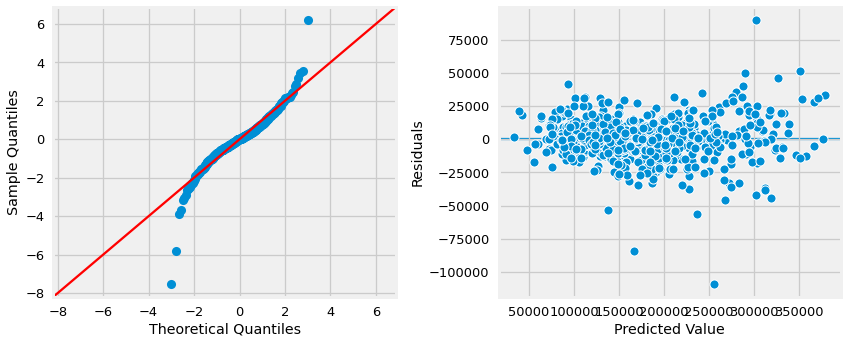

In [55]:
## instantiate an OLS model WITH the training data.
model_cln_scaled_cnst = sm.OLS(y_train_cln, X_train_scaled_df_cln_cnst)

## Fit the model and view the summary
result_cln_scaled_cnst = model_cln_scaled_cnst.fit()
sf.evaluate_ols(result_cln_scaled_cnst,X_train_scaled_df_cln_cnst, y_train_cln)

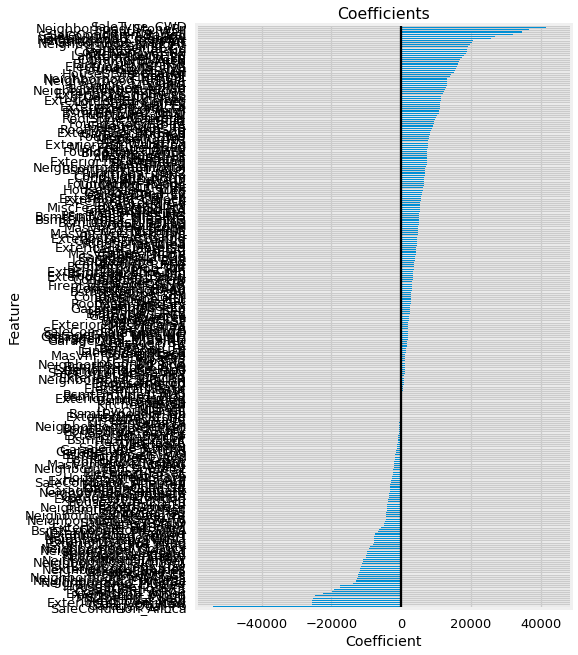

In [56]:
fig_scaled =sf.plot_coeffs(result_cln_scaled_cnst,ohe_cols,include_const=True)

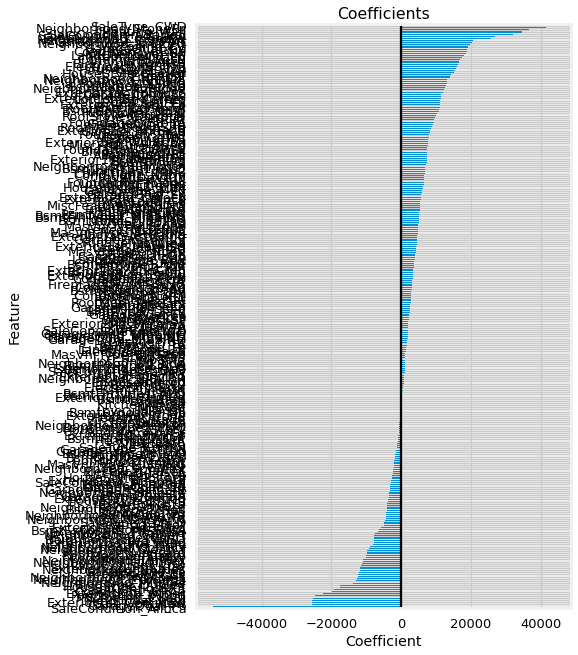

In [57]:
fig_scaled =sf.plot_coeffs(result_cln_scaled_cnst,ohe_cols,include_const=False)

# Adding Explanations

## Sklearn LinearRegression

> Pick 1 of the statsmodels models above to remake in sklearn for model explanations

In [58]:
from sklearn.linear_model import LinearRegression

In [59]:
## Making new var name sfor sklearn - update these to change model
ols_results = result_scaled_cnst
# sf.evaluate_ols(ols_results,X_tr,y_tr)
X_tr = X_train_scaled_df_cnst
X_te = X_test_scaled_df_cnst
y_tr = y_train
y_te = y_test

## If const in orig df, 
fit_intercept = 'const' in X_tr.columns

if fit_intercept==True:
    X_tr = X_tr.drop(columns='const')
    X_te = X_te.drop(columns='const')
fit_intercept

True

In [60]:
linreg = LinearRegression(fit_intercept=fit_intercept)
linreg.fit(X_tr, y_tr)
print(f"Train R^2: {format(linreg.score(X_tr,y_tr),'.2f')}")
print(f"Test R^2: {format(linreg.score(X_te,y_te),'.2f')}")
linreg.get_params()

Train R^2: 0.95
Test R^2: -2977092855343316992.00


{'copy_X': True,
 'fit_intercept': True,
 'n_jobs': None,
 'normalize': 'deprecated',
 'positive': False}

In [61]:
coeffs = sf.get_coeffs(linreg,X_tr,name='LinReg Coeffs')
coeffs#.head(20)

MSSubClass              -1.347221e+03
LotFrontage              4.485457e+02
LotArea                  1.120314e+04
OverallQual              8.895316e+03
OverallCond              5.801907e+03
                             ...     
SaleCondition_Alloca     1.413731e+15
SaleCondition_Family     1.413731e+15
SaleCondition_Normal     1.413731e+15
SaleCondition_Partial    1.413731e+15
const                    3.373983e+16
Name: LinReg Coeffs, Length: 303, dtype: float64

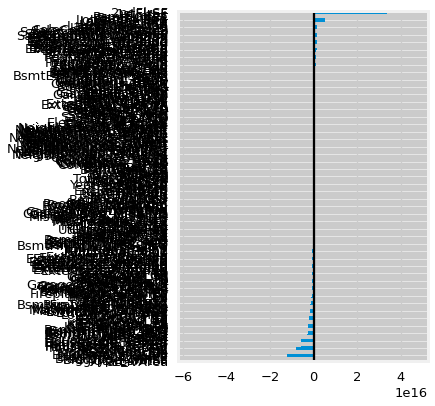

In [62]:
ax = coeffs.drop(ohe_cols).sort_values().plot(kind='barh',figsize=(4,6))
ax.axvline(0,color='black')

In [63]:
if len(ohe_cols)>1:

    ax = coeffs[ohe_cols].sort_values().plot(kind='barh',figsize=(4,6))
    ax.axvline(0,color='black')

In [64]:
## save 1 df of skelarn vs ols coeffs
compare_coeffs = pd.DataFrame({'OLS':ols_results.params,
                              'LinReg':coeffs}).round(2)
compare_coeffs['Agree?'] = compare_coeffs['OLS']==compare_coeffs['LinReg']

display(compare_coeffs.round(3))
compare_coeffs['Agree?'].value_counts(1)
#compare_coeffs.style.format({'OLS':"{:,.2f}","LinReg":"{:,.2f}"})

,OLS,LinReg,Agree?
MSSubClass,-1682.67,-1.347220e+03,False
LotFrontage,474.55,4.485500e+02,False
LotArea,11231.08,1.120314e+04,False
OverallQual,8701.91,8.895320e+03,False
OverallCond,5943.91,5.801910e+03,False
...,...,...,...
SaleCondition_Alloca,3776.71,1.413731e+15,False
SaleCondition_Family,-1157.76,1.413731e+15,False
SaleCondition_Normal,263.42,1.413731e+15,False
SaleCondition_Partial,2801.58,1.413731e+15,False


False    1.0
Name: Agree?, dtype: float64

In [65]:
compare_coeffs[compare_coeffs['Agree?']==True]

,OLS,LinReg,Agree?


In [66]:
# compare_coeffs[compare_coeffs['Agree?']==False]

In [67]:
compare_coeffs.style.bar()

,OLS,LinReg,Agree?
MSSubClass,-1682.670000,-1347.220000,False
LotFrontage,474.550000,448.550000,False
LotArea,11231.080000,11203.140000,False
OverallQual,8701.910000,8895.320000,False
OverallCond,5943.910000,5801.910000,False
YearBuilt,9205.180000,9165.730000,False
YearRemodAdd,1913.000000,1851.420000,False
MasVnrArea,3080.600000,3077.220000,False
BsmtFinSF1,8951.220000,23584306497737948.000000,False
BsmtFinSF2,1548.560000,8530449614179617.000000,False


> ISSUE WITH COEFFICIENTS NOT MATCHING - SEE IF TRUE FOR OTHER DATASETS. 

### Shap

In [68]:
import shap
shap.initjs()

shap.__version__

'0.41.0'

In [69]:
## sampling 200 rows from training data
X_shap = shap.sample(X_tr,nsamples=200,random_state=321)

In [70]:
## Creating explainer from model and getting shap values
explainer = shap.LinearExplainer(linreg,X_shap)
shap_values = explainer(X_shap)
shap_values.shape

(200, 302)

In [71]:
# [i for i in dir(shap_values) if not i.startswith("_")]

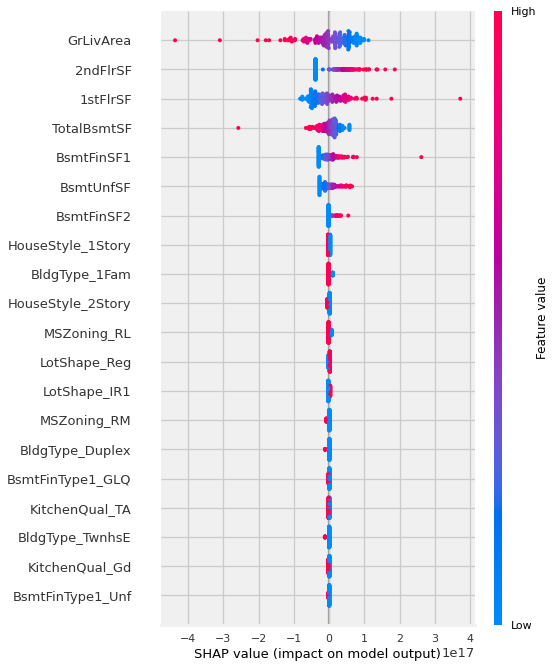

In [72]:
shap.summary_plot(shap_values)

In [73]:
explainer.expected_value

195204.0

In [74]:
shap.force_plot(explainer.expected_value,shap_values= shap_values.values, features=X_shap)       

## RandomForest

In [75]:
from sklearn.ensemble import RandomForestRegressor
rf_reg = RandomForestRegressor()
rf_reg.fit(X_tr,y_tr)

RandomForestRegressor()

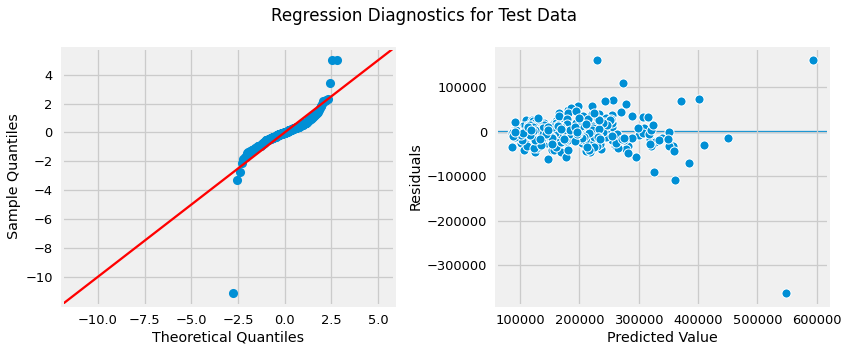

Score
Metric Split          
R^2    Train      0.98
       Test       0.82
RMSE   Train  10963.08
       Test   32541.55

In [76]:
scores = sf.evaluate_regression(rf_reg,X_te, y_te, X_train_df=X_tr, y_train=y_tr,
                            return_scores=True)

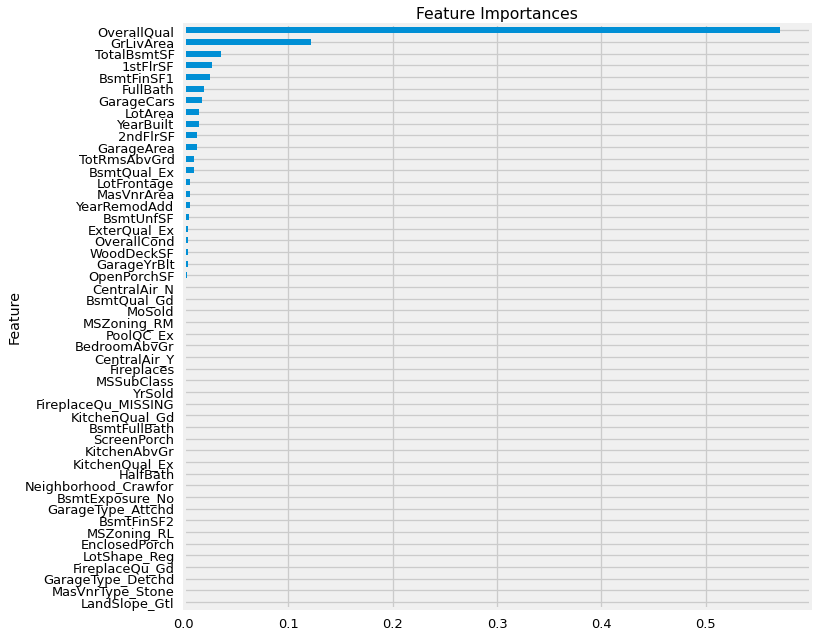

In [77]:
importances = sf.get_importance(rf_reg,X_test_df,top_n=50)

### Permutation Importance

In [78]:
from sklearn.inspection import permutation_importance
## Permutation importance takes a fit mode and test data. 
r = permutation_importance(linreg, X_tr, y_tr,
#                            n_repeats=30
                          )
r.keys()

dict_keys(['importances_mean', 'importances_std', 'importances'])

In [79]:
## can make the mean importances into a series
permutation_importances = pd.Series(r['importances_mean'],index=X_tr.columns,
                           name = 'permutation importance')
permutation_importances

MSSubClass               7.174633e-04
LotFrontage              1.376568e-04
LotArea                  3.932584e-02
OverallQual              2.548318e-02
OverallCond              1.017775e-02
                             ...     
SaleCondition_AdjLand    2.252161e+18
SaleCondition_Alloca     6.080835e+18
SaleCondition_Family     9.459077e+18
SaleCondition_Normal     9.188818e+19
SaleCondition_Partial    4.853408e+19
Name: permutation importance, Length: 302, dtype: float64

<AxesSubplot:>

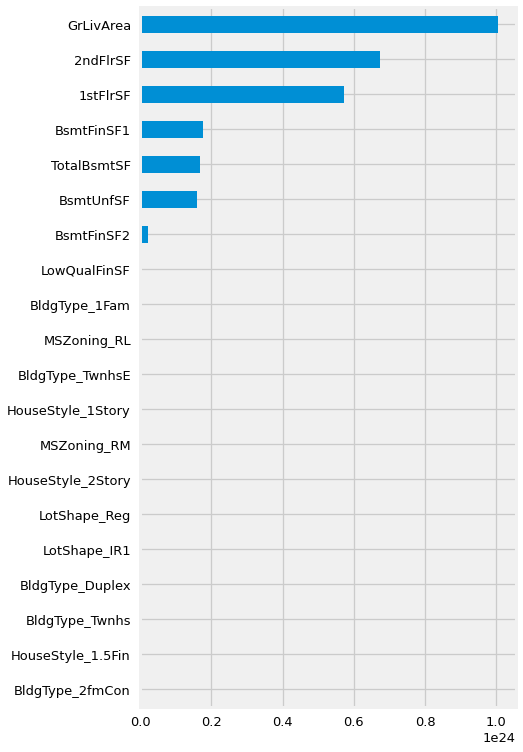

In [80]:
permutation_importances.sort_values().tail(20).plot(kind='barh',figsize=(6,12))

In [81]:
X_shap = shap.sample(X_tr,nsamples=200,random_state=321)

In [82]:
explainer = shap.TreeExplainer(rf_reg,X_shap)
shap_values = explainer(X_shap)

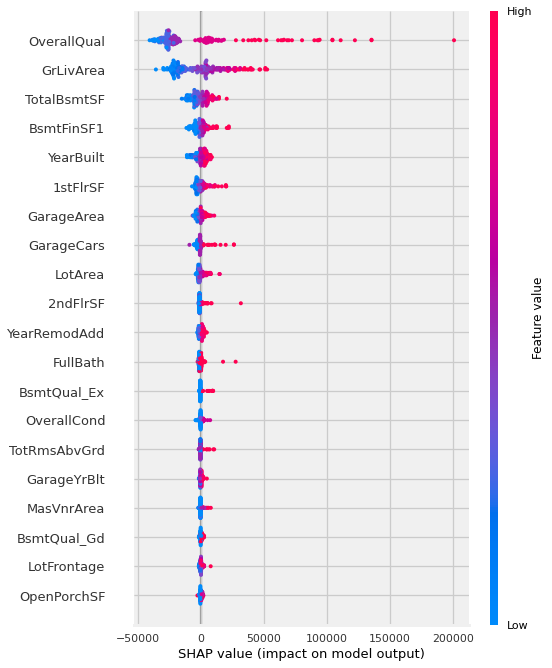

In [83]:
shap.summary_plot(shap_values)

In [84]:
shap.force_plot(explainer.expected_value,shap_values= shap_values.values, features=X_shap)       